# Building Prophet Models for YNP Geysers

After the pre-processing step, the next step is building models. Since the geyser eruption data is intuitively time-series, the use of Prophet, a general purpose forecasting tool open-sourced by Facebook, is ideal.

Additionally Prophet, inherently, is able to deal with missing data, noisy data and irregularly spaced data, all three properties that are present in my dataset.

In [1]:
# setup

import pandas as pd
pd.set_option('display.max_columns', None)

import numpy as np

import math

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

from datetime import datetime
from pytz import timezone

from fbprophet import Prophet

import pickle

### Importing Data

In [2]:
maindf = pd.read_csv('processed_dataframe.csv')
maindf

,datetime,geyser,eruption_time_epoch,date,time,interval_length
0,2000-01-01 05:12:00-07:00,Great Fountain,946728720,2000-01-01,05:12:00,NaN
1,2000-01-01 05:59:00-07:00,Grand,946731540,2000-01-01,05:59:00,NaN
2,2000-01-01 16:37:00-07:00,Great Fountain,946769820,2000-01-01,16:37:00,685.0
3,2000-01-01 17:14:00-07:00,Grand,946772040,2000-01-01,17:14:00,675.0
4,2000-01-02 04:18:00-07:00,Great Fountain,946811880,2000-01-02,04:18:00,701.0
...,...,...,...,...,...,...
786424,2019-09-05 20:40:00-06:00,Jet,1567737600,2019-09-05,20:40:00,2.0
786425,2019-09-05 20:41:00-06:00,Jet,1567737660,2019-09-05,20:41:00,1.0
786426,2019-09-05 20:43:00-06:00,Jet,1567737780,2019-09-05,20:43:00,2.0
786427,2019-09-05 21:01:00-06:00,Aurum,1567738860,2019-09-05,21:01:00,373.0


Old Faithful      97638
Plume             81944
Little Cub        72291
Daisy             58138
Lion              35747
Spouter           25471
Aurum             22983
Oblong            22966
Logbridge         21720
Grand             19970
Fountain          19744
Turban            15612
Baby Daisy        14647
Riverside         14398
Depression        13728
Castle            12770
West Triplet      12200
Jet               11835
Grotto            11792
Great Fountain    11514
Bead              10946
Plate             10623
Occasional         9342
Pink               9242
Narcissus          8994
Vixen              8496
Artemisia          7271
Pyramid            6867
Beehive            6851
Sprinkler          5593
Name: geyser, dtype: int64


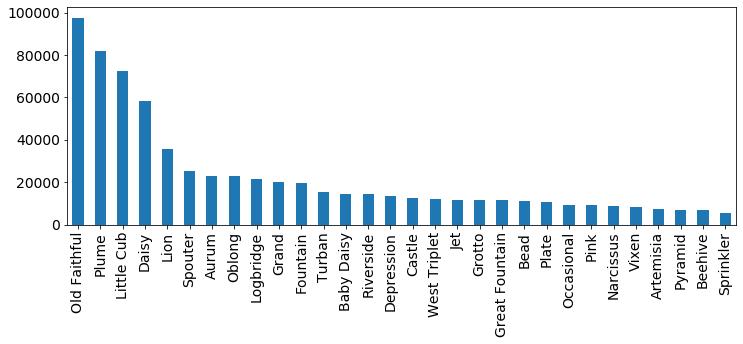

In [3]:
# Checking data size for top 30 geysers 

print(maindf['geyser'].value_counts()[:30])
maindf['geyser'].value_counts()[:30].plot.bar(figsize=(12,4), fontsize=14)

### Creating UTC time columns because of Prophet requirement

In [4]:
# Adding UTC datetime column to maindf
maindf['utc_datetime'] = pd.to_datetime(maindf['eruption_time_epoch'],unit='s')

In [5]:
# Resetting index to utc_datetime
maindf.set_index('utc_datetime', inplace=True)

### Transforming Data

Calculating a variable for time-untill-next-eruption. This way, for each (Geyser,Timestamp) pair, an additional value which indicates the time untill next eruption is calculated. This becomes the target variable that is then predicted by the model. 

In [6]:
# creating column for time till next eruption
maindf['t_nxt_eruption'] = np.nan

In [7]:
### populating t_nxt_eruption

# Creating an empty initial-timestamp dictionary  
geyser_ini_timestamp_dict = dict.fromkeys(maindf.geyser.unique(),0)

# Populating timstamp dictionary with initial timestamps
for i in maindf.index:
    geyser = maindf.get_value(i,'geyser')
    if geyser_ini_timestamp_dict[geyser] == 0:
        geyser_ini_timestamp_dict[geyser] = i

/home/siddharth/anaconda3/envs/insight/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning:

get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead



In [8]:
# populating t_nxt_eruption

for i in maindf.index:
    geyser = maindf.get_value(i,'geyser')
    prev_timestamp = geyser_ini_timestamp_dict[geyser] 
    if i == prev_timestamp:
        pass
    else:
        t_nxt_erupt = prev_timestamp - i
        t_nxt_erupt = (t_nxt_erupt.total_seconds() // 60) * -1
        maindf.set_value(prev_timestamp,'t_nxt_eruption', t_nxt_erupt)
        geyser_ini_timestamp_dict[geyser] = i

/home/siddharth/anaconda3/envs/insight/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning:

get_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead

/home/siddharth/anaconda3/envs/insight/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning:

set_value is deprecated and will be removed in a future release. Please use .at[] or .iat[] accessors instead



In [14]:
maindf.reset_index(inplace=True)

In [9]:
maindf

,datetime,geyser,eruption_time_epoch,date,time,interval_length,t_nxt_eruption
utc_datetime,,,,,,,
2000-01-01 12:12:00,2000-01-01 05:12:00-07:00,Great Fountain,946728720,2000-01-01,05:12:00,NaN,685.0
2000-01-01 12:59:00,2000-01-01 05:59:00-07:00,Grand,946731540,2000-01-01,05:59:00,NaN,675.0
2000-01-01 23:37:00,2000-01-01 16:37:00-07:00,Great Fountain,946769820,2000-01-01,16:37:00,685.0,701.0
2000-01-02 00:14:00,2000-01-01 17:14:00-07:00,Grand,946772040,2000-01-01,17:14:00,675.0,675.0
2000-01-02 11:18:00,2000-01-02 04:18:00-07:00,Great Fountain,946811880,2000-01-02,04:18:00,701.0,771.0
...,...,...,...,...,...,...,...
2019-09-06 02:40:00,2019-09-05 20:40:00-06:00,Jet,1567737600,2019-09-05,20:40:00,2.0,1.0
2019-09-06 02:41:00,2019-09-05 20:41:00-06:00,Jet,1567737660,2019-09-05,20:41:00,1.0,2.0
2019-09-06 02:43:00,2019-09-05 20:43:00-06:00,Jet,1567737780,2019-09-05,20:43:00,2.0,NaN


## Separating Geysers into individual dataframes and building model

### Old Faithful

In [26]:
ofdf = maindf.loc[maindf['geyser'] == 'Old Faithful']
ofdf.shape

(97638, 7)

t_nxt_eruption captures time between two events. If eruption events were not recorded between two events, then the value of t_nxt_eruption increases. As a result when we plot the frequency distribution of t_nxt eruption, we see a long tailed distribution representing timepoints after which there are missing events.

I filter out these data points by based on values which will only retain the primary distribution. See similar description for Riverside geyser

Text(0.5, 1.0, 'Histogram of Interval Lengths')

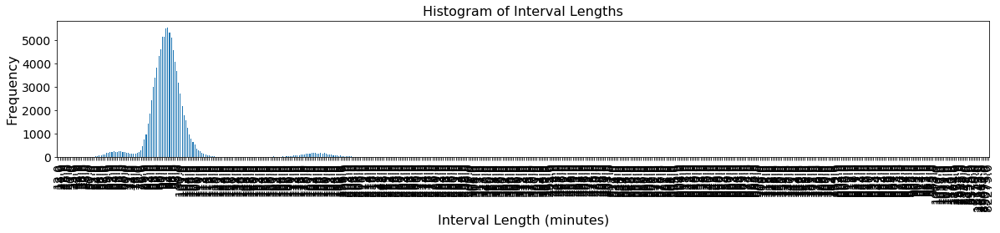

In [27]:
#print(ofdf['t_nxt_eruption'].value_counts().sort_index().iloc[10:80])
ax = ofdf['t_nxt_eruption'].value_counts().sort_index().iloc[:].plot.bar(figsize=(20,3), fontsize=14)
ax.set_xlabel("Interval Length (minutes)", fontsize=16)
ax.set_ylabel("Frequency", fontsize=16)
ax.set_title("Histogram of Interval Lengths", fontsize=16)

Filtering the data such that it only contains t_nxt_eruption values between 51 and 120 minutes results in a much cleaner frequency distribution

51.0     10
52.0     16
53.0     20
54.0     40
55.0     64
         ..
116.0    61
117.0    40
118.0    25
119.0    34
120.0    15
Name: t_nxt_eruption, Length: 70, dtype: int64


Text(0.5, 1.0, 'Histogram of Interval Lengths')

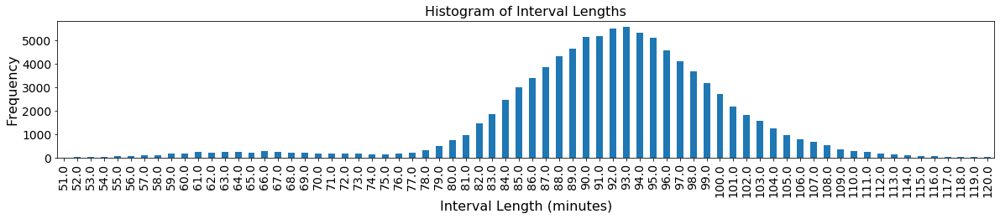

In [28]:
print(ofdf['t_nxt_eruption'].value_counts().sort_index().iloc[19:89])
ax = ofdf['t_nxt_eruption'].value_counts().sort_index().iloc[19:89].plot.bar(figsize=(20,3), fontsize=14)
ax.set_xlabel("Interval Length (minutes)", fontsize=16)
ax.set_ylabel("Frequency", fontsize=16)
ax.set_title("Histogram of Interval Lengths", fontsize=16)

In [29]:
print(ofdf.shape)
ofdf = ofdf.loc[(ofdf['t_nxt_eruption'] >= 51.0) & (ofdf['t_nxt_eruption'] <= 120.0)]
print(ofdf.shape)
ofdf.head()

(97638, 7)
(92947, 7)


,datetime,geyser,eruption_time_epoch,date,time,interval_length,t_nxt_eruption
utc_datetime,,,,,,,
2000-10-11 19:56:00,2000-10-11 13:56:00-06:00,Old Faithful,971294160,2000-10-11,13:56:00,NaN,81.0
2000-10-11 21:17:00,2000-10-11 15:17:00-06:00,Old Faithful,971299020,2000-10-11,15:17:00,81.0,83.0
2000-10-11 22:40:00,2000-10-11 16:40:00-06:00,Old Faithful,971304000,2000-10-11,16:40:00,83.0,89.0
2000-10-12 00:09:00,2000-10-11 18:09:00-06:00,Old Faithful,971309340,2000-10-11,18:09:00,89.0,81.0
2000-10-12 01:30:00,2000-10-11 19:30:00-06:00,Old Faithful,971314200,2000-10-11,19:30:00,81.0,90.0


#### Raw Data

After the filtering procedure, the raw data still has a lot of noise in it. This can be because the fluctuations in t_nxt_eruption over a long span of time can be more than the noise introduced by inconsistent event recording and hence the filtering procedure will not be able to weed out the missing events captured in long interval lengths.

Performing a smoothing procedure transforms the data such that long t_nxt_eruption values are decreased but the shorter values reflecting no missing events remain overall unaffected.

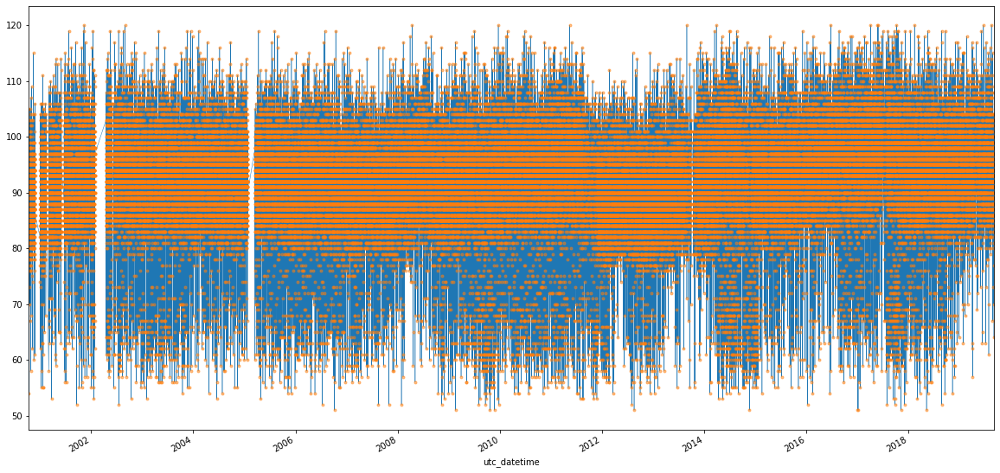

In [30]:
ofdf.iloc[:].t_nxt_eruption.plot(linewidth=0.5, figsize=(20, 3))
ofdf.iloc[:].t_nxt_eruption.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20,10))
#ofdf.t_nxt_eruption.plot(linewidth=0.5, figsize=(20, 3))
#ofdf.t_nxt_eruption.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 3))

#### Smoothed Data

In [31]:
ofdf['smooth_interval'] = ofdf.t_nxt_eruption.rolling(5).mean()

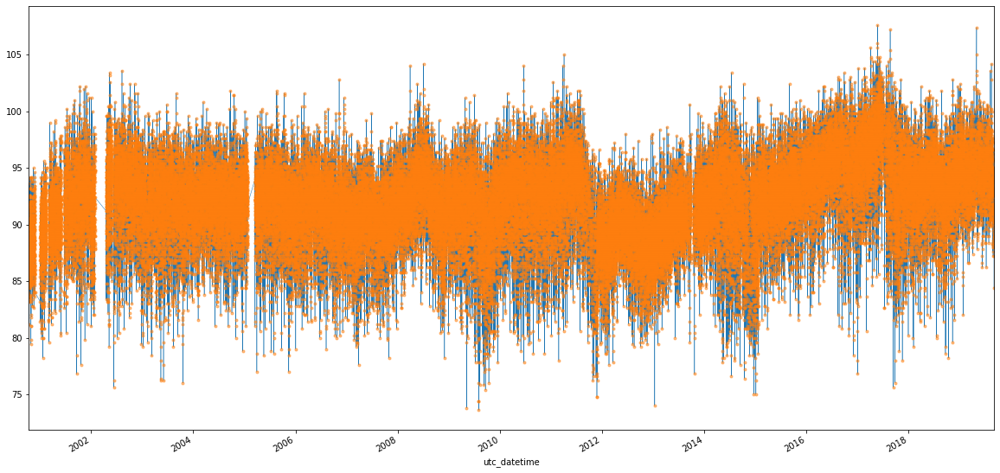

In [32]:
ofdf.iloc[:].smooth_interval.plot(linewidth=0.5, figsize=(20, 3))
ofdf.iloc[:].smooth_interval.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10))

In [33]:
ofdf.reset_index(inplace=True)

In [34]:
ofdf.head()

,utc_datetime,datetime,geyser,eruption_time_epoch,date,time,interval_length,t_nxt_eruption,smooth_interval
0,2000-10-11 19:56:00,2000-10-11 13:56:00-06:00,Old Faithful,971294160,2000-10-11,13:56:00,NaN,81.0,NaN
1,2000-10-11 21:17:00,2000-10-11 15:17:00-06:00,Old Faithful,971299020,2000-10-11,15:17:00,81.0,83.0,NaN
2,2000-10-11 22:40:00,2000-10-11 16:40:00-06:00,Old Faithful,971304000,2000-10-11,16:40:00,83.0,89.0,NaN
3,2000-10-12 00:09:00,2000-10-11 18:09:00-06:00,Old Faithful,971309340,2000-10-11,18:09:00,89.0,81.0,NaN
4,2000-10-12 01:30:00,2000-10-11 19:30:00-06:00,Old Faithful,971314200,2000-10-11,19:30:00,81.0,90.0,84.8


To validate the model, we need to train the model on continuous time and test on future time. Thus we can set aside all eruptions from June 2019 onwards as our test set.

In [35]:
# Checking last day of May 31st 2019
print(ofdf.index[ofdf['date'] == '2019-05-31'].to_list()[:])

[91781, 91782, 91783, 91784, 91785, 91786, 91787, 91788, 91789, 91790, 91791, 91792, 91793, 91794, 91795]


In [36]:
# creating df for prophet with raw data

cols = ['utc_datetime','t_nxt_eruption']
df = ofdf.loc[:91781,cols]

valdf = ofdf.loc[91781:,cols]
valdf.drop(columns=['t_nxt_eruption'], axis=1, inplace=True)
valdf.rename(columns = {'utc_datetime':'ds'}, inplace=True)
print(valdf.head())

df.rename(columns = {'utc_datetime':'ds', 't_nxt_eruption':'y'}, inplace=True)

df = df.reset_index()
df.drop(['index'], axis=1, inplace=True)

df

                       ds
91781 2019-05-31 07:00:00
91782 2019-05-31 08:33:00
91783 2019-05-31 10:00:00
91784 2019-05-31 11:39:00
91785 2019-05-31 13:18:00


,ds,y
0,2000-10-11 19:56:00,81.0
1,2000-10-11 21:17:00,83.0
2,2000-10-11 22:40:00,89.0
3,2000-10-12 00:09:00,81.0
4,2000-10-12 01:30:00,90.0
...,...,...
91777,2019-05-31 00:38:00,86.0
91778,2019-05-31 02:04:00,105.0
91779,2019-05-31 03:49:00,102.0
91780,2019-05-31 05:31:00,89.0


### Creating a workflow

A large number of factors can affect the model accuracy. For example the duration of timepoints used for training as well as the hyperparameters which tune seasonality and flexibility of fit.

For Old Faithful, I investigate multiple ways, first fitting the model on all of the raw data, then pruning the training time period to start from 2016 onward, based on trend, rechecking model parameters on raw data. I then fit the model on smooth data, from 2016 onward, with tuned seasonality parameters (daily seaonality). And finally I do a grid search across multiple changepoint_prior_scale values to find the optimal flexibilty of the fit.

I then train the production model on all of the available data, using optimal parameters for seasonality and fit.

For all following geysers - the workflow will first fit all available smoothed data to find best seasonality parameters. Then a grid search over pruned data for tuning flexibility, followed by training the production model.

Creating a default Prophet object

In [40]:
m = Prophet()

Checking Seasonality on raw data

In [41]:
m.add_seasonality(name='daily', period=1, fourier_order=3)

In [42]:
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)

In [43]:
m.add_seasonality(name='quarterly', period=120, fourier_order=5)

In [44]:
# Fitting the data to the model
m.fit(df)

INFO:fbprophet:Found custom seasonality named "daily", disabling built-in daily seasonality.


In [46]:
future = m.make_future_dataframe(periods=1)
future = future.iloc[:-1]
future = pd.concat([future,valdf])

In [47]:
m_forecast = m.predict(future)

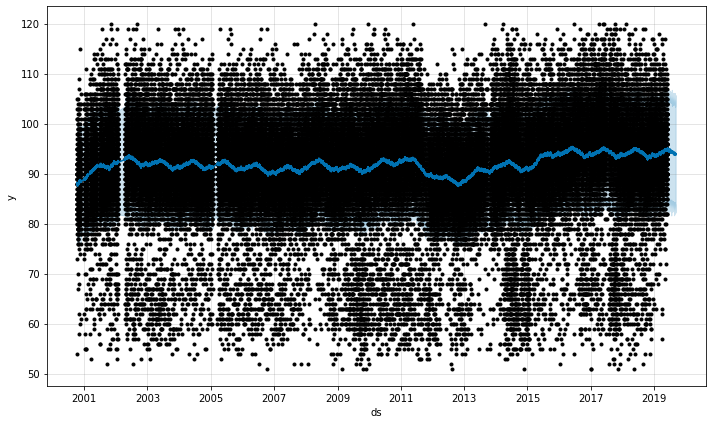

In [49]:
fig1 = m.plot(m_forecast)

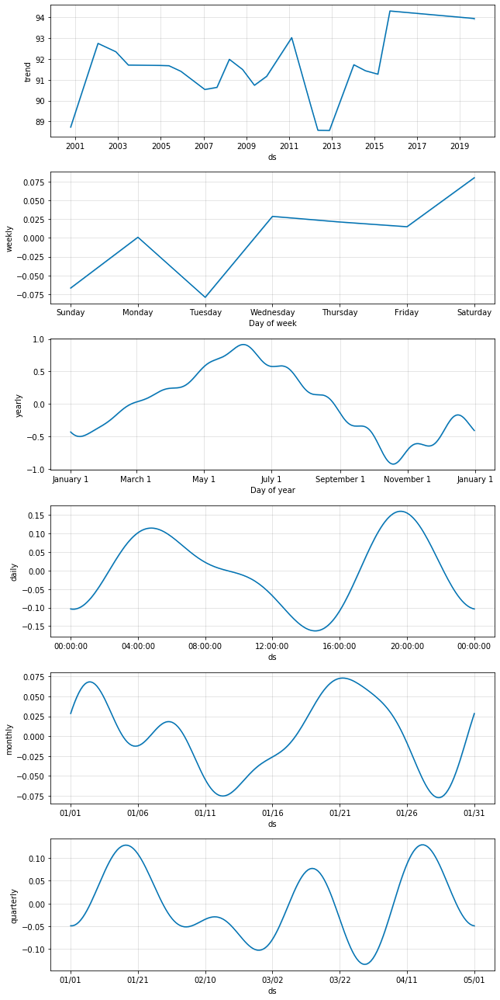

In [50]:
fig2 = m.plot_components(m_forecast)

Since the trend gets stable from 2016 onward and there are many data points available to fit the model, pruning the dataset to retain eruptions after 2016

### Defining the Validation Function

In [210]:
def validate_model(test_df, train_df):
    
    newdf = pd.concat([train_df,test_df], axis=1)
    
    newdf['abs_err'] = (newdf['yhat']-newdf['smooth_interval']).abs()
    print('Mean Absolute Error = ', newdf['abs_err'].mean())
    print('Std Dev of MAE = ', newdf['abs_err'].std())
    
    newdf['uncertainty'] = newdf['yhat_upper']-newdf['yhat_lower']
    print('Mean Uncertainty in predictions ', newdf['uncertainty'].mean())
    print('Std Dev of Uncertainty in predictions ', newdf['uncertainty'].std())
    
    newdf['accr'] = 0
    
    for i in newdf.index:
        if newdf.loc[i,'abs_err'] <= newdf.loc[i,'uncertainty']:
            newdf.loc[i,'accr'] = 1
    
    acr = (newdf['accr'].value_counts()[1]/len(newdf.index)) * 100
    print('Percent Accuracy of predictions ', acr)
    
    return 0

In [53]:
testdf = ofdf.loc[91781:,['utc_datetime','t_nxt_eruption']]
testdf.reset_index(inplace=True)

l = len(valdf['ds'])

traindf = m_forecast.iloc[(-1*l):]
traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
traindf.reset_index(inplace=True)

In [55]:
validate_model(testdf, traindf)

Mean Absolute Error =  5.397597864099325
Mean Uncertainty in predictions  21.64547922874638
Std Dev of Uncertainty in predictions  0.6027340640469822
Percent Accuracy of predictions  98.79931389365352


0

### Pruning data

In [57]:
# Keeping only data from 2016 onward because of steady trend
print(ofdf.index[ofdf['date'] == '2016-01-01'].to_list()[0])
print(ofdf.shape)
ofdf = ofdf.loc[74695:]
ofdf.shape

74695
(92947, 9)


(18252, 9)

In [59]:
cols = ['utc_datetime','t_nxt_eruption']
df = ofdf.loc[:91781,cols]

valdf = ofdf.loc[91781:,cols]
valdf.drop(columns=['t_nxt_eruption'], axis=1, inplace=True)
valdf.rename(columns = {'utc_datetime':'ds'}, inplace=True)
print(valdf.head())

df.rename(columns = {'utc_datetime':'ds', 't_nxt_eruption':'y'}, inplace=True)

df = df.reset_index()
df.drop(['index'], axis=1, inplace=True)

df

                       ds
91781 2019-05-31 07:00:00
91782 2019-05-31 08:33:00
91783 2019-05-31 10:00:00
91784 2019-05-31 11:39:00
91785 2019-05-31 13:18:00


,ds,y
0,2016-01-01 11:10:00,94.0
1,2016-01-01 12:44:00,94.0
2,2016-01-01 14:18:00,87.0
3,2016-01-01 15:45:00,96.0
4,2016-01-01 17:21:00,96.0
...,...,...
17082,2019-05-31 00:38:00,86.0
17083,2019-05-31 02:04:00,105.0
17084,2019-05-31 03:49:00,102.0
17085,2019-05-31 05:31:00,89.0


In [65]:
m = Prophet()
m.add_seasonality(name='daily', period=1, fourier_order=3)
m.add_seasonality(name='monthly', period=30.5, fourier_order=3)
m.add_seasonality(name='quarterly', period=120, fourier_order=3)

In [66]:
m.fit(df)

INFO:fbprophet:Found custom seasonality named "daily", disabling built-in daily seasonality.


In [67]:
future = m.make_future_dataframe(periods=1)
future = future.iloc[:-1]
future = pd.concat([future,valdf])

In [68]:
m_forecast = m.predict(future)

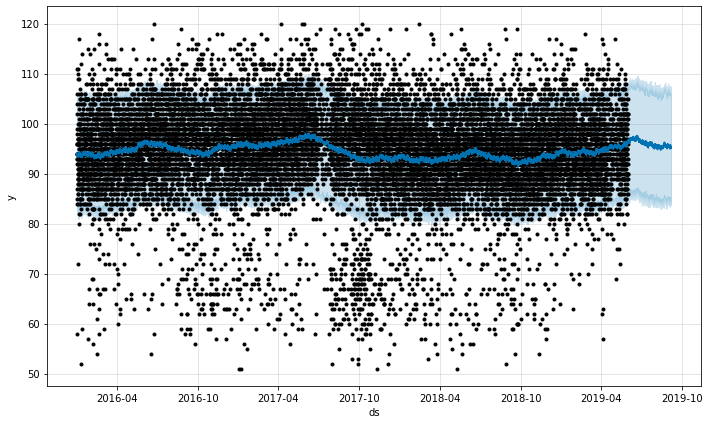

In [69]:
fig1 = m.plot(m_forecast)

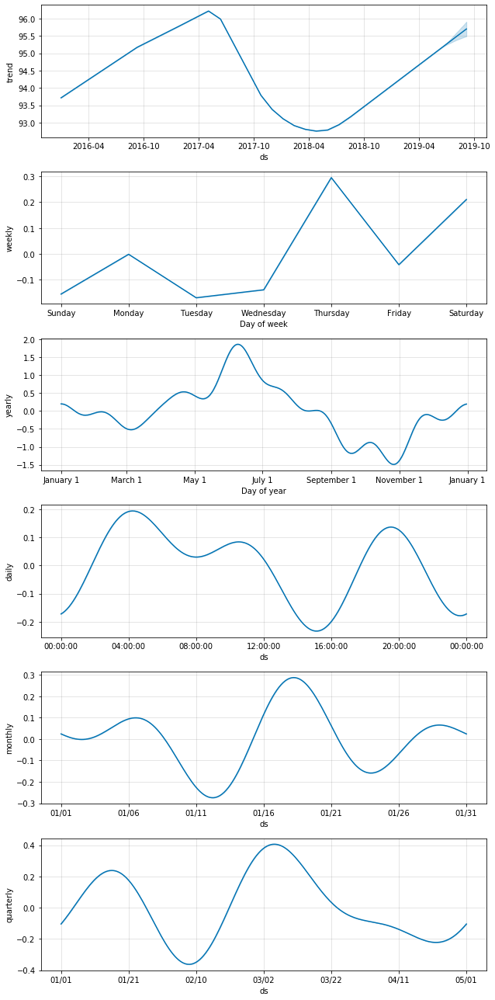

In [70]:
fig2 = m.plot_components(m_forecast)

Results are consistent with the previous fit wherein quarterly and monthly seasonal components do not seem particularly useful for the model. Whereas the daily seasonality shows signal.

In [71]:
testdf = ofdf.loc[91781:,['utc_datetime','t_nxt_eruption']]
testdf.reset_index(inplace=True)

l = len(valdf['ds'])

traindf = m_forecast.iloc[(-1*l):]
traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
traindf.reset_index(inplace=True)

validate_model(testdf, traindf)

Mean Absolute Error =  5.631111322972592
Mean Uncertainty in predictions  22.211505776736477
Std Dev of Uncertainty in predictions  0.6155754021385474
Percent Accuracy of predictions  98.88507718696398


0

### Fitting on Smoothed Data

In [72]:
cols = ['utc_datetime','smooth_interval']
df = ofdf.loc[:91781,cols]

valdf = ofdf.loc[91781:,cols]
valdf.drop(columns=['smooth_interval'], axis=1, inplace=True)
valdf.rename(columns = {'utc_datetime':'ds'}, inplace=True)
print(valdf.head())

df.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)

df = df.reset_index()
df.drop(['index'], axis=1, inplace=True)

df

                       ds
91781 2019-05-31 07:00:00
91782 2019-05-31 08:33:00
91783 2019-05-31 10:00:00
91784 2019-05-31 11:39:00
91785 2019-05-31 13:18:00


,ds,y
0,2016-01-01 11:10:00,94.8
1,2016-01-01 12:44:00,95.4
2,2016-01-01 14:18:00,94.6
3,2016-01-01 15:45:00,96.0
4,2016-01-01 17:21:00,93.4
...,...,...
17082,2019-05-31 00:38:00,94.2
17083,2019-05-31 02:04:00,96.8
17084,2019-05-31 03:49:00,97.0
17085,2019-05-31 05:31:00,96.8


In [73]:
# Increasing the fourier_order value to 5 to better fit the daily fluctuations.
m = Prophet()
m.add_seasonality(name='daily', period=1, fourier_order=5)

In [74]:
m.fit(df)

INFO:fbprophet:Found custom seasonality named "daily", disabling built-in daily seasonality.


In [75]:
future = m.make_future_dataframe(periods=1)
future = future.iloc[:-1]
future = pd.concat([future,valdf])

m_forecast = m.predict(future)

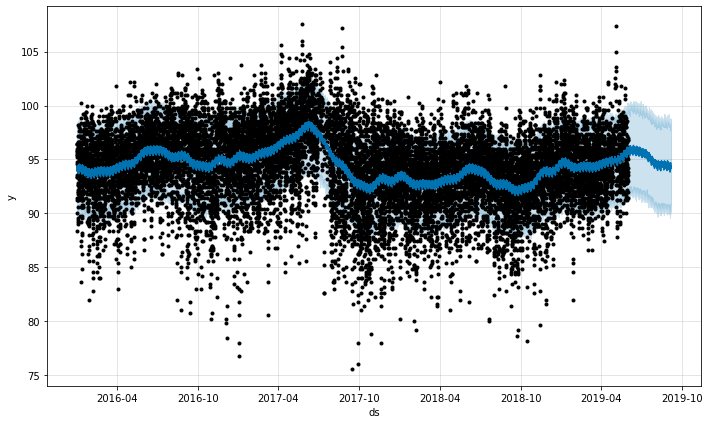

In [76]:
fig1 = m.plot(m_forecast)

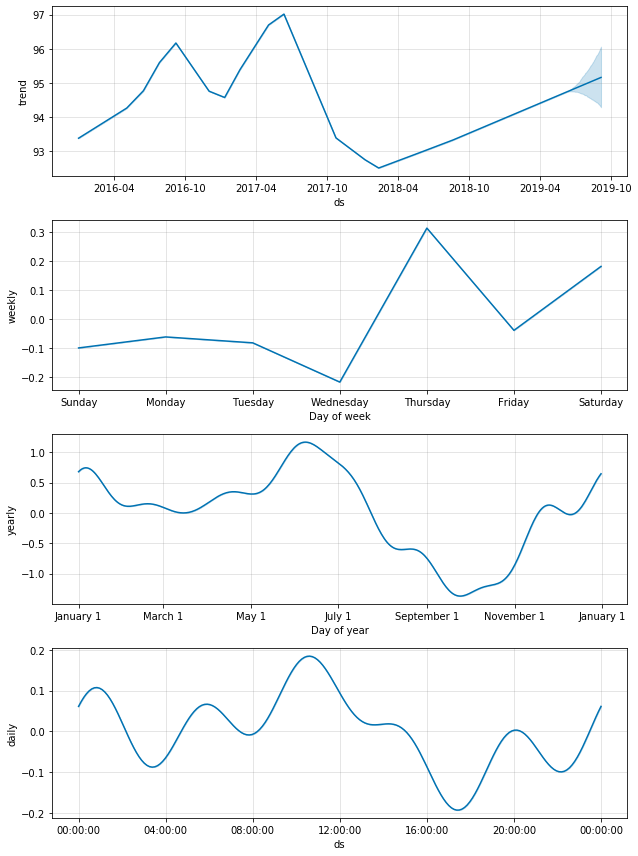

In [77]:
fig2 = m.plot_components(m_forecast)

In [80]:
testdf = ofdf.loc[91781:,['utc_datetime','smooth_interval']]
testdf.reset_index(inplace=True)

l = len(valdf['ds'])

traindf = m_forecast.iloc[(-1*l):]
traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
traindf.reset_index(inplace=True)

validate_model(testdf, traindf)

Mean Absolute Error =  2.0964956610311236
Mean Uncertainty in predictions  7.9785596442127815
Std Dev of Uncertainty in predictions  0.23581288918220022
Percent Accuracy of predictions  99.31389365351629


0

### Tuning the flexibility of the model fit

In [81]:
changepoint_prior_scale_list=[0.01, 0.05, 0.1, 0.25, 0.5]

In [84]:
for i in changepoint_prior_scale_list:
    print('changepoint prior scale', i)
    m = Prophet(changepoint_prior_scale=i)
    m.add_seasonality(name='daily', period=1, fourier_order=5)
    m.fit(df)
    future = m.make_future_dataframe(periods=1)
    future = future.iloc[:-1]
    future = pd.concat([future,valdf])
    m_forecast = m.predict(future)
    l = len(valdf['ds'])
    
    traindf = m_forecast.iloc[(-1*l):]
    traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
    traindf.reset_index(inplace=True)
    
    validate_model(testdf, traindf)

INFO:fbprophet:Found custom seasonality named "daily", disabling built-in daily seasonality.


changepoint prior scale 0.01
Mean Absolute Error =  2.312419927341025
Mean Uncertainty in predictions  7.96979125238525
Std Dev of Uncertainty in predictions  0.22931839133828694


INFO:fbprophet:Found custom seasonality named "daily", disabling built-in daily seasonality.


Percent Accuracy of predictions  99.14236706689536
changepoint prior scale 0.05
Mean Absolute Error =  2.0964956610311236
Mean Uncertainty in predictions  7.99272609628912
Std Dev of Uncertainty in predictions  0.23735363439854393


INFO:fbprophet:Found custom seasonality named "daily", disabling built-in daily seasonality.


Percent Accuracy of predictions  99.31389365351629
changepoint prior scale 0.1
Mean Absolute Error =  2.0922445845948543
Mean Uncertainty in predictions  8.0262399204226
Std Dev of Uncertainty in predictions  0.2456539829058011


INFO:fbprophet:Found custom seasonality named "daily", disabling built-in daily seasonality.


Percent Accuracy of predictions  99.31389365351629
changepoint prior scale 0.25
Mean Absolute Error =  2.1189527765453087
Mean Uncertainty in predictions  8.052217037174037
Std Dev of Uncertainty in predictions  0.2778281492047352


INFO:fbprophet:Found custom seasonality named "daily", disabling built-in daily seasonality.


Percent Accuracy of predictions  99.31389365351629
changepoint prior scale 0.5
Mean Absolute Error =  2.1171550534687604
Mean Uncertainty in predictions  8.24468591155863
Std Dev of Uncertainty in predictions  0.41179069152854736
Percent Accuracy of predictions  99.31389365351629


From the grid search it is the clear that the default value of 0.05 will be ideal for Old Faithful, possibly because the geyser has a very regular behavior which is captured nicely with the daily seasonality. 

### Training the production model

In [88]:
cols = ['utc_datetime','smooth_interval']
df = ofdf.loc[:,cols]
df.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)
df = df.reset_index()
df.drop(['index'], axis=1, inplace=True)
df

,ds,y
0,2016-01-01 11:10:00,94.8
1,2016-01-01 12:44:00,95.4
2,2016-01-01 14:18:00,94.6
3,2016-01-01 15:45:00,96.0
4,2016-01-01 17:21:00,93.4
...,...,...
18247,2019-09-05 16:11:00,90.4
18248,2019-09-05 17:45:00,89.2
18249,2019-09-05 19:14:00,93.2
18250,2019-09-06 00:28:00,93.2


In [93]:
# Creating the Prophet object with the optimal flex parameter
m_oldfaithful_production = Prophet(changepoint_prior_scale=0.05)
# Adding the optimal seasonality parameter
m_oldfaithful_production.add_seasonality(name='daily', period=1, fourier_order=5)
# Fitting all available data
m_oldfaithful_production.fit(df)
# Creating a df for plotting purposes
future = m_oldfaithful_production.make_future_dataframe(periods=1)
ofdf_forecast = m_oldfaithful_production.predict(future)

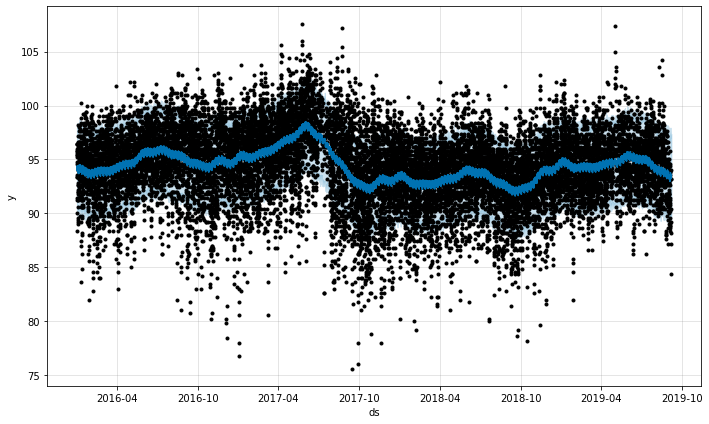

In [92]:
# Plotting the model
fig1 = m_oldfaithful_production.plot(ofdf_forecast)

In [94]:
# Saving the production model
with open('m_oldfaithful_production_model.pckl', 'wb') as fout:
    pickle.dump(m_oldfaithful_production, fout)

End of Old Faithful Analysis

### Beehive

In [127]:
beedf = maindf.loc[maindf['geyser'] == 'Beehive']
beedf.shape

(6851, 7)

441.0     1
456.0     1
488.0     1
499.0     1
512.0     1
         ..
1559.0    3
1560.0    3
1561.0    1
1562.0    1
1563.0    3
Name: t_nxt_eruption, Length: 999, dtype: int64


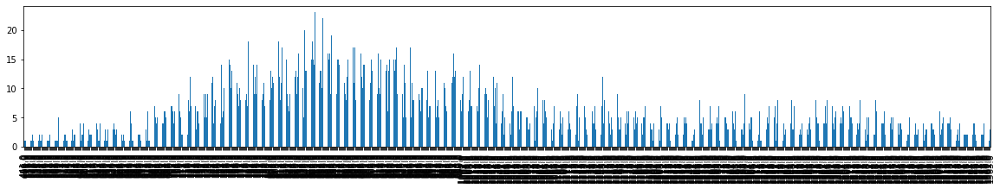

In [128]:
print(beedf['t_nxt_eruption'].value_counts().sort_index().iloc[1:1000])
beedf['t_nxt_eruption'].value_counts().sort_index().iloc[1:1000].plot.bar(figsize=(20,3))

In [129]:
print(beedf.shape)
beedf = beedf.loc[(beedf['t_nxt_eruption'] >= 441.0) & (beedf['t_nxt_eruption'] <= 1500.0)]
print(beedf.shape)
beedf.tail()

(6851, 7)
(5773, 7)


,datetime,geyser,eruption_time_epoch,date,time,interval_length,t_nxt_eruption
utc_datetime,,,,,,,
2019-09-01 22:40:00,2019-09-01 16:40:00-06:00,Beehive,1567377600,2019-09-01,16:40:00,2102.0,1139.0
2019-09-02 17:39:00,2019-09-02 11:39:00-06:00,Beehive,1567445940,2019-09-02,11:39:00,1139.0,1125.0
2019-09-03 12:24:00,2019-09-03 06:24:00-06:00,Beehive,1567513440,2019-09-03,06:24:00,1125.0,921.0
2019-09-04 03:45:00,2019-09-03 21:45:00-06:00,Beehive,1567568700,2019-09-03,21:45:00,921.0,933.0
2019-09-04 19:18:00,2019-09-04 13:18:00-06:00,Beehive,1567624680,2019-09-04,13:18:00,933.0,1269.0


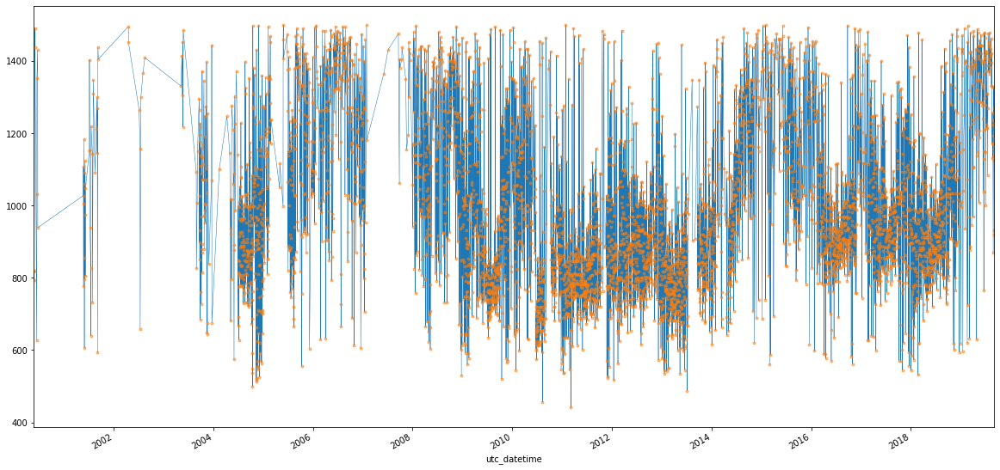

In [130]:
beedf.t_nxt_eruption.plot(linewidth=0.5, figsize=(20, 10))
beedf.t_nxt_eruption.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10))

Since beehive data seems to suffer from excessive noise in terms of inconsistent event recording, it makes sense to increase the rolling average window size to smooth the data.

In [131]:
beedf['smooth_interval'] = beedf.t_nxt_eruption.rolling(10).mean()

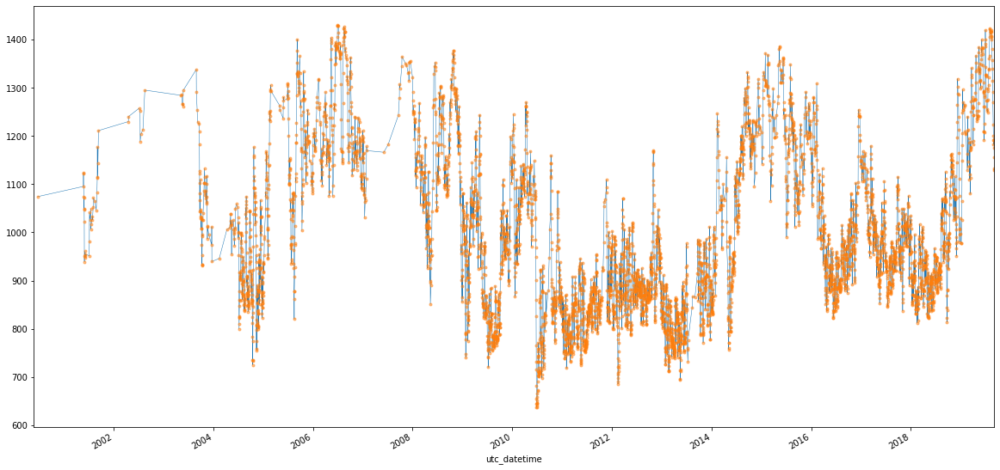

In [132]:
beedf.smooth_interval.plot(linewidth=0.5, figsize=(20, 10))
beedf.smooth_interval.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10))

In [133]:
beedf.reset_index(inplace=True)

In [144]:
# Keeping only data from 2008 onward because of missing data before 2008
print(beedf.index[beedf['date'] == '2008-01-01'].to_list()[0])
print(beedf.shape)
beedf = beedf.loc[894:]
beedf.shape

894
(5773, 9)


(4879, 9)

In [145]:
# Checking last day of May 31st 2019
print(beedf.index[beedf['date'] == '2019-05-31'].to_list())

[5697]


In [146]:
# creating df for prophet

cols = ['utc_datetime','smooth_interval']
bdf = beedf.loc[:5697,cols]

valdf = beedf.loc[5697:,cols]
valdf.drop(columns=['smooth_interval'], axis=1, inplace=True)
valdf.rename(columns = {'utc_datetime':'ds'}, inplace=True)
print(valdf.head())

bdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)

bdf = bdf.reset_index()
bdf.drop(['index'], axis=1, inplace=True)

bdf

                      ds
5697 2019-05-31 18:14:00
5698 2019-06-01 17:56:00
5699 2019-06-02 16:17:00
5700 2019-06-04 16:54:00
5701 2019-06-05 16:58:00


,ds,y
0,2008-01-01 19:21:00,1321.2
1,2008-01-02 13:00:00,1291.4
2,2008-01-03 08:00:00,1273.5
3,2008-01-04 03:31:00,1252.1
4,2008-01-04 19:12:00,1249.2
...,...,...
4799,2019-05-26 18:55:00,1298.5
4800,2019-05-28 18:14:00,1302.2
4801,2019-05-29 18:18:00,1348.7
4802,2019-05-30 18:51:00,1360.1


In [191]:
m = Prophet()
m.add_seasonality(name='monthly', period=30.5, fourier_order=3)
m.add_seasonality(name='quarterly', period=120, fourier_order=3)
m.add_seasonality(name='5yearly', period=1825, fourier_order=10)

In [192]:
m.fit(bdf)

In [193]:
future = m.make_future_dataframe(periods=1)
future = future.iloc[:-1]
future = pd.concat([future,valdf])

In [194]:
m_forecast = m.predict(future)

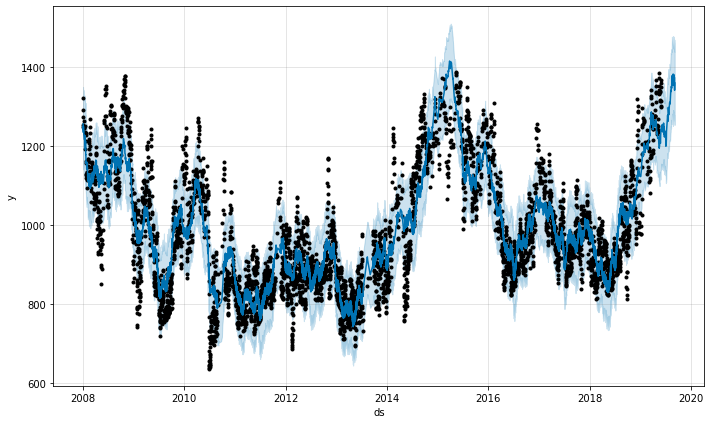

In [195]:
fig1 = m.plot(m_forecast)

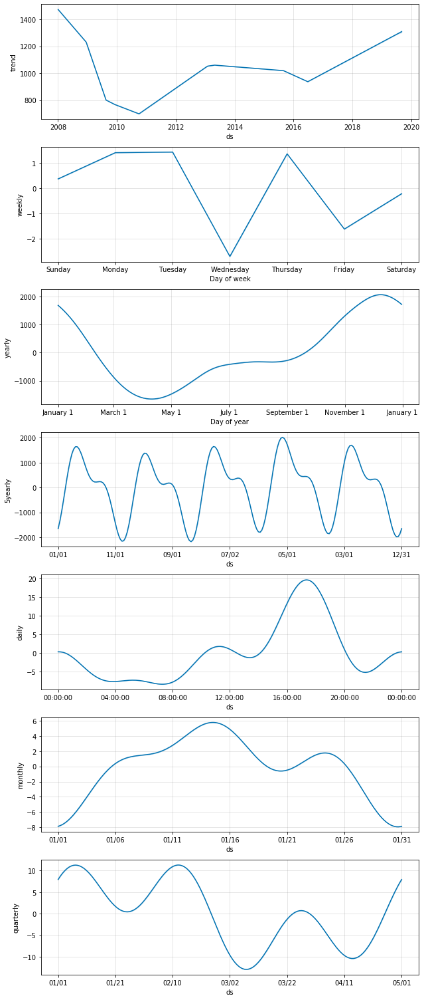

In [196]:
fig2 = m.plot_components(m_forecast)

Looking at the various seasonalities, its clear that the weekly, monthly and quarterly seasonalities do not have a signal, whereas daily seasonality has some signal. The strongest signal comes from the 5 yearly and yearly seasonalities.

In [197]:
testdf = beedf.loc[5697:,['utc_datetime','smooth_interval']]
testdf.reset_index(inplace=True)

l = len(valdf['ds'])

traindf = m_forecast.iloc[(-1*l):]
traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
traindf.reset_index(inplace=True)

validate_model(testdf, traindf)

Mean Absolute Error =  85.82696172556707
Mean Uncertainty in predictions  189.47925305584855
Std Dev of Uncertainty in predictions  6.147001374483202
Percent Accuracy of predictions  92.10526315789474


0

Since the data is sparse and already pruned, we can do a grid search for optimizing the flexibility of the fit next.

Also, since there is a high amount of variation, there is no point reducing the flexibility of the fit, so we can search the higher values only.

In [198]:
changepoint_prior_scale_list=[0.05, 0.1, 0.25, 0.5]

for i in changepoint_prior_scale_list:
    print('changepoint prior scale', i)
    m = Prophet(changepoint_prior_scale=i, weekly_seasonality=False)
    m.add_seasonality(name='5yearly', period=1825, fourier_order=10)
    m.fit(bdf)
    future = m.make_future_dataframe(periods=1)
    future = future.iloc[:-1]
    future = pd.concat([future,valdf])
    m_forecast = m.predict(future)
    l = len(valdf['ds'])
    
    traindf = m_forecast.iloc[(-1*l):]
    traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
    traindf.reset_index(inplace=True)
    
    validate_model(testdf, traindf)

changepoint prior scale 0.05
Mean Absolute Error =  79.86341255699493
Mean Uncertainty in predictions  189.9847613133813
Std Dev of Uncertainty in predictions  5.933462826376391
Percent Accuracy of predictions  93.42105263157895
changepoint prior scale 0.1
Mean Absolute Error =  75.39380159306852
Mean Uncertainty in predictions  188.73539179088706
Std Dev of Uncertainty in predictions  5.526877627230547
Percent Accuracy of predictions  88.1578947368421
changepoint prior scale 0.25
Mean Absolute Error =  117.57971328468906
Mean Uncertainty in predictions  184.11206833953798
Std Dev of Uncertainty in predictions  7.9145786254751815
Percent Accuracy of predictions  84.21052631578947
changepoint prior scale 0.5
Mean Absolute Error =  163.7179946088836
Mean Uncertainty in predictions  185.40729709023034
Std Dev of Uncertainty in predictions  11.727245597128794
Percent Accuracy of predictions  72.36842105263158


The grid search shows that 0.05 is still the best value for the best balance vs MAE and Accuracy.

### Training the Production Model

In [199]:
cols = ['utc_datetime','smooth_interval']
bdf = beedf.loc[:,cols]
bdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)
bdf = bdf.reset_index()
bdf.drop(['index'], axis=1, inplace=True)
bdf

,ds,y
0,2008-01-01 19:21:00,1321.2
1,2008-01-02 13:00:00,1291.4
2,2008-01-03 08:00:00,1273.5
3,2008-01-04 03:31:00,1252.1
4,2008-01-04 19:12:00,1249.2
...,...,...
4874,2019-09-01 22:40:00,1189.5
4875,2019-09-02 17:39:00,1176.3
4876,2019-09-03 12:24:00,1155.2
4877,2019-09-04 03:45:00,1129.1


In [200]:
# Creating the Prophet object with the optimal flex parameter
m_beehive_production = Prophet(changepoint_prior_scale=0.05, weekly_seasonality=False)

# Adding the optimal seasonality parameter
m_beehive_production.add_seasonality(name='5yearly', period=1825, fourier_order=10)

# Fitting all available data
m_beehive_production.fit(bdf)

# Creating a df for plotting purposes
future = m_beehive_production.make_future_dataframe(periods=1)
beedf_forecast = m_beehive_production.predict(future)

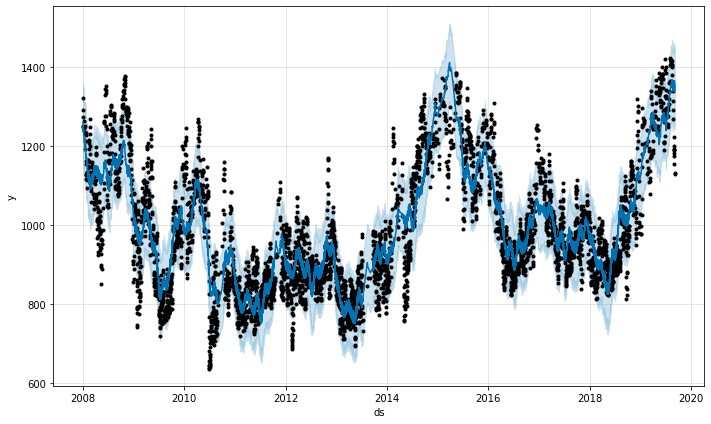

In [202]:
# Plotting the model
fig1 = m_beehive_production.plot(beedf_forecast)

In [203]:
# Saving the production model
with open('m_beehive_production_model.pckl', 'wb') as fout:
    pickle.dump(m_beehive_production, fout)

End of Beehive Analysis

### Daisy

In [231]:
daisydf = maindf.loc[maindf['geyser'] == 'Daisy']
daisydf.shape

(58138, 7)

106.0     51
107.0     30
108.0     72
109.0     40
110.0    113
        ... 
221.0     45
222.0     52
223.0     51
224.0     49
225.0     56
Name: t_nxt_eruption, Length: 120, dtype: int64


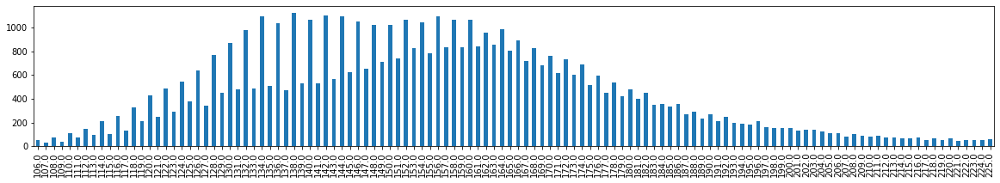

In [232]:
print(daisydf['t_nxt_eruption'].value_counts().sort_index().iloc[95:215])
daisydf['t_nxt_eruption'].value_counts().sort_index().iloc[95:215].plot.bar(figsize=(20,3))

In [233]:
print(daisydf.shape)
daisydf = daisydf.loc[(daisydf['t_nxt_eruption'] >= 106.0) & (daisydf['t_nxt_eruption'] <= 225.0)]
print(daisydf.shape)
daisydf.tail()

(58138, 7)
(54011, 7)


,datetime,geyser,eruption_time_epoch,date,time,interval_length,t_nxt_eruption
utc_datetime,,,,,,,
2019-09-05 10:09:00,2019-09-05 04:09:00-06:00,Daisy,1567678140,2019-09-05,04:09:00,141.0,138.0
2019-09-05 12:27:00,2019-09-05 06:27:00-06:00,Daisy,1567686420,2019-09-05,06:27:00,138.0,148.0
2019-09-05 14:55:00,2019-09-05 08:55:00-06:00,Daisy,1567695300,2019-09-05,08:55:00,148.0,136.0
2019-09-05 21:50:00,2019-09-05 15:50:00-06:00,Daisy,1567720200,2019-09-05,15:50:00,279.0,133.0
2019-09-06 00:03:00,2019-09-05 18:03:00-06:00,Daisy,1567728180,2019-09-05,18:03:00,133.0,130.0


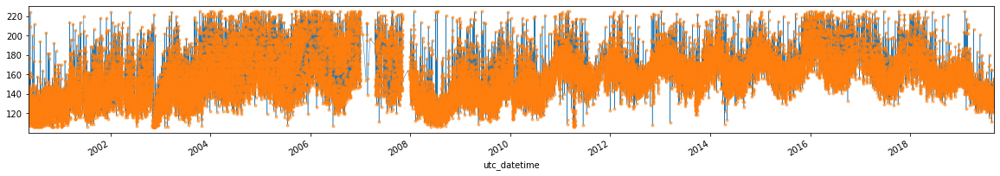

In [234]:
daisydf.t_nxt_eruption.plot(linewidth=0.5, figsize=(20, 3))
daisydf.t_nxt_eruption.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 3))

In [235]:
daisydf['smooth_interval'] = daisydf.t_nxt_eruption.rolling(5).mean()

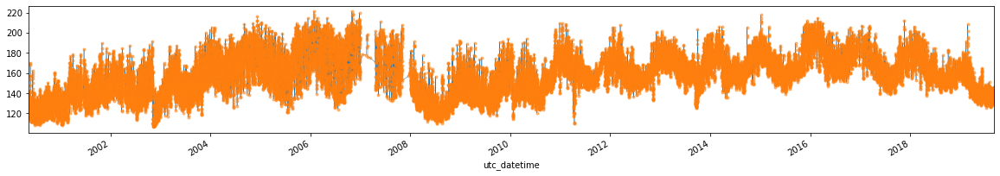

In [236]:
daisydf.smooth_interval.plot(linewidth=0.5, figsize=(20, 3))
daisydf.smooth_interval.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 3))

In [237]:
daisydf.reset_index(inplace=True)

In [238]:
# Keeping data from 2010 onward because of missing data as well as a different trend before 2008 and enough data points
# after 2010
print(daisydf.index[daisydf['date'] == '2010-01-01'].to_list()[0])
print(daisydf.shape)
daisydf = daisydf.loc[28401:]
daisydf.shape

28401
(54011, 9)


(25610, 9)

In [239]:
# Checking last day of May 31st 2019
print(daisydf.index[daisydf['date'] == '2019-05-31'].to_list())

[53187, 53188, 53189]


In [240]:
# creating df for prophet

cols = ['utc_datetime','smooth_interval']
ddf = daisydf.loc[:53187,cols]

valdf = daisydf.loc[53187:,cols]
valdf.drop(columns=['smooth_interval'], axis=1, inplace=True)
valdf.rename(columns = {'utc_datetime':'ds'}, inplace=True)
print(valdf.head())

ddf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)

ddf = ddf.reset_index()
ddf.drop(['index'], axis=1, inplace=True)

ddf

                       ds
53187 2019-05-31 14:42:00
53188 2019-05-31 17:04:00
53189 2019-06-01 05:15:00
53190 2019-06-01 07:37:00
53191 2019-06-01 10:06:00


,ds,y
0,2010-01-01 07:10:00,178.4
1,2010-01-01 10:00:00,176.4
2,2010-01-01 12:56:00,172.8
3,2010-01-01 15:42:00,171.6
4,2010-01-01 18:32:00,168.4
...,...,...
24782,2019-05-30 19:54:00,138.8
24783,2019-05-30 22:05:00,135.6
24784,2019-05-31 00:15:00,133.2
24785,2019-05-31 02:31:00,134.6


In [269]:
m = Prophet(weekly_seasonality=True, daily_seasonality=True)
m.add_seasonality(name='monthly', period=30.5, fourier_order=3)
m.add_seasonality(name='quarterly', period=120, fourier_order=5)

m.fit(ddf)

future = m.make_future_dataframe(periods=1)
future = future.iloc[:-1]
future = pd.concat([future,valdf])

m_forecast = m.predict(future)

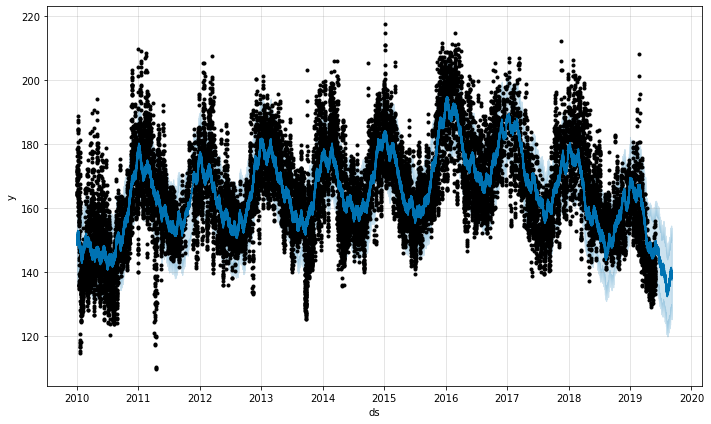

In [270]:
fig1 = m.plot(m_forecast)

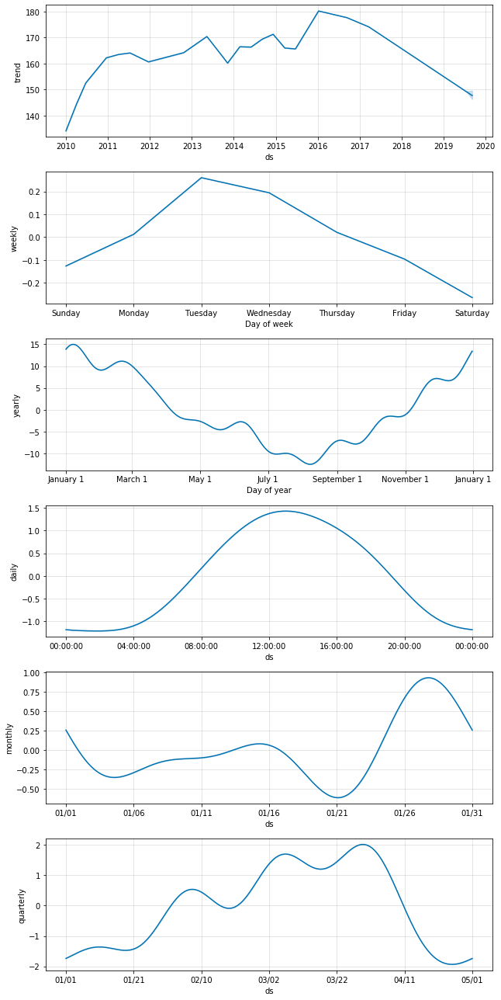

In [271]:
fig2 = m.plot_components(m_forecast)

In [272]:
testdf = daisydf.loc[53187:,['utc_datetime','smooth_interval']]
testdf.reset_index(inplace=True)

l = len(valdf['ds'])

traindf = m_forecast.iloc[(-1*l):]
traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
traindf.reset_index(inplace=True)

validate_model(testdf, traindf)

Mean Absolute Error =  4.954841614246439
Std Dev of MAE =  3.8604285135794605
Mean Uncertainty in predictions  24.263764975201024
Std Dev of Uncertainty in predictions  0.7266531142957044
Percent Accuracy of predictions  100.0


0

The most informative seasonalities seem to be daily, quarterly and yearly (returning the best metrics), thus we can do a grid search based on these seasonality parameters

In [274]:
changepoint_prior_scale_list=[0.05, 0.1, 0.25, 0.5]

for i in changepoint_prior_scale_list:
    print('changepoint prior scale', i)
    m = Prophet(changepoint_prior_scale=i, weekly_seasonality=False)
    m.add_seasonality(name='quarterly', period=120, fourier_order=5)
    m.fit(ddf)
    future = m.make_future_dataframe(periods=1)
    future = future.iloc[:-1]
    future = pd.concat([future,valdf])
    m_forecast = m.predict(future)
    l = len(valdf['ds'])
    
    traindf = m_forecast.iloc[(-1*l):]
    traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
    traindf.reset_index(inplace=True)
    
    validate_model(testdf, traindf)

changepoint prior scale 0.05
Mean Absolute Error =  4.927706348232168
Std Dev of MAE =  3.794990089157416
Mean Uncertainty in predictions  24.290795160522414
Std Dev of Uncertainty in predictions  0.687817645923374
Percent Accuracy of predictions  100.0
changepoint prior scale 0.1
Mean Absolute Error =  5.004486732598323
Std Dev of MAE =  3.809966202511922
Mean Uncertainty in predictions  24.48145063218299
Std Dev of Uncertainty in predictions  0.854768912329908
Percent Accuracy of predictions  100.0
changepoint prior scale 0.25
Mean Absolute Error =  5.044648627747033
Std Dev of MAE =  3.8081345117593184
Mean Uncertainty in predictions  24.56640366078884
Std Dev of Uncertainty in predictions  0.9699264828201435
Percent Accuracy of predictions  100.0
changepoint prior scale 0.5
Mean Absolute Error =  5.046220142173743
Std Dev of MAE =  3.8107992852522212
Mean Uncertainty in predictions  24.661585651538086
Std Dev of Uncertainty in predictions  1.0344298722288947
Percent Accuracy of pre

Changing flexibility of the fit doesn't seem to affect the MAE much however the lowest value is still for 0.05 which can be used for the production model.

In [275]:
cols = ['utc_datetime','smooth_interval']
ddf = daisydf.loc[:,cols]
ddf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)
ddf = ddf.reset_index()
ddf.drop(['index'], axis=1, inplace=True)
ddf

,ds,y
0,2010-01-01 07:10:00,178.4
1,2010-01-01 10:00:00,176.4
2,2010-01-01 12:56:00,172.8
3,2010-01-01 15:42:00,171.6
4,2010-01-01 18:32:00,168.4
...,...,...
25605,2019-09-05 10:09:00,139.2
25606,2019-09-05 12:27:00,143.2
25607,2019-09-05 14:55:00,142.0
25608,2019-09-05 21:50:00,139.2


In [276]:
# Creating the Prophet object with the optimal flex parameter
m_daisy_production = Prophet(changepoint_prior_scale=0.05, weekly_seasonality=False)

# Adding the optimal seasonality parameter
m_daisy_production.add_seasonality(name='quarterly', period=120, fourier_order=5)

# Fitting all available data
m_daisy_production.fit(ddf)

# Creating a df for plotting purposes
future = m_daisy_production.make_future_dataframe(periods=1)
daisydf_forecast = m_daisy_production.predict(future)

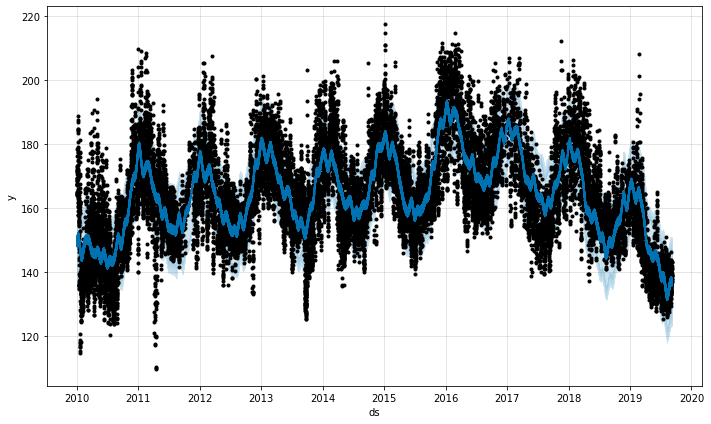

In [277]:
# Plotting the model
fig1 = m_daisy_production.plot(daisydf_forecast)

In [278]:
# Saving the production model
with open('m_daisy_production_model.pckl', 'wb') as fout:
    pickle.dump(m_daisy_production, fout)

End of Daisy Analysis

### Riverside

In [423]:
riverdf = maindf.loc[maindf['geyser'] == 'Riverside']
riverdf.shape

(14398, 7)

Transforming data into t_nxt_eruption results in some data points to have extremely large values. These values represent two time-points with missing event between them. Plotting a frequency distribution of t_nxt_eruption results in long tails. These are filtered and removed to clean up the data. Currently what values to filter are decided by me based on my intuition. 

306.0     2
307.0     1
309.0     2
311.0     1
312.0     2
         ..
413.0    22
414.0    15
415.0    15
416.0    19
417.0     9
Name: t_nxt_eruption, Length: 110, dtype: int64


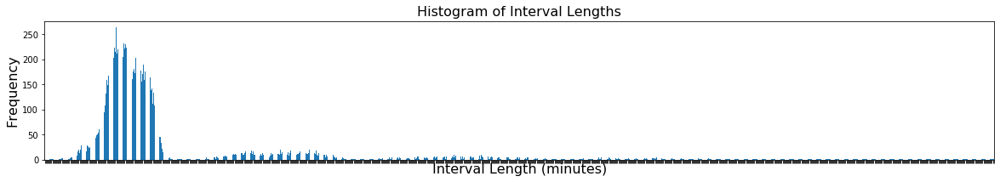

In [424]:
print(riverdf['t_nxt_eruption'].value_counts().sort_index().iloc[20:130])
ax = riverdf['t_nxt_eruption'].value_counts().sort_index().iloc[:].plot.bar(figsize=(20,3))
ax.set_xlabel("Interval Length (minutes)", fontsize=16)
ax.set_ylabel("Frequency", fontsize=16)
ax.set_title("Histogram of Interval Lengths", fontsize=16)
plt.tick_params(axis='x', labelbottom=False)

Text(0.5, 1.0, 'Histogram of Interval Lengths')

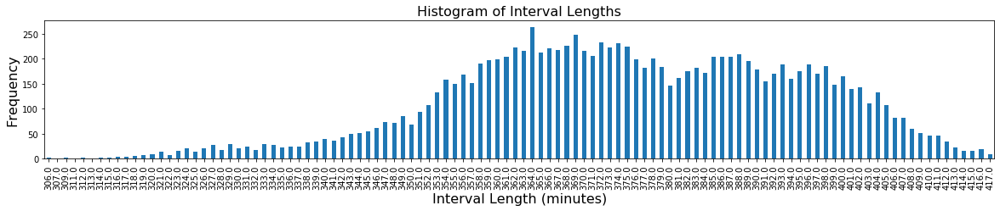

In [425]:
#print(riverdf['t_nxt_eruption'].value_counts().sort_index().iloc[20:130])
ax = riverdf['t_nxt_eruption'].value_counts().sort_index().iloc[20:130].plot.bar(figsize=(20,3))
ax.set_xlabel("Interval Length (minutes)", fontsize=16)
ax.set_ylabel("Frequency", fontsize=16)
ax.set_title("Histogram of Interval Lengths", fontsize=16)
#plt.tick_params(axis='x', labelbottom=False)

In [426]:
print(riverdf.shape)
riverdf = riverdf.loc[(riverdf['t_nxt_eruption'] >= 301.0) & (riverdf['t_nxt_eruption'] <= 425.0)]
print(riverdf.shape)
riverdf.tail()

(14398, 7)
(11639, 7)


,datetime,geyser,eruption_time_epoch,date,time,interval_length,t_nxt_eruption
utc_datetime,,,,,,,
2019-08-30 19:08:00,2019-08-30 13:08:00-06:00,Riverside,1567192080,2019-08-30,13:08:00,354.0,361.0
2019-08-31 12:45:00,2019-08-31 06:45:00-06:00,Riverside,1567255500,2019-08-31,06:45:00,696.0,363.0
2019-09-01 18:47:00,2019-09-01 12:47:00-06:00,Riverside,1567363620,2019-09-01,12:47:00,1439.0,367.0
2019-09-03 12:12:00,2019-09-03 06:12:00-06:00,Riverside,1567512720,2019-09-03,06:12:00,1092.0,366.0
2019-09-04 15:20:00,2019-09-04 09:20:00-06:00,Riverside,1567610400,2019-09-04,09:20:00,1262.0,353.0


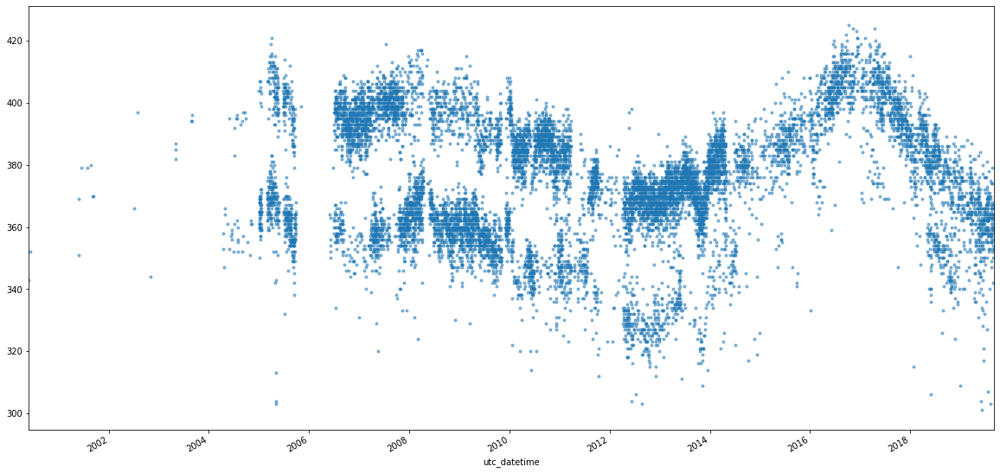

In [427]:
#riverdf.t_nxt_eruption.plot(linewidth=0.5, figsize=(20, 10))
riverdf.t_nxt_eruption.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10))
#riverdf.lag2.plot(linewidth=0.5, figsize=(20, 3))
#riverdf.lag2.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 3))

In [428]:
riverdf['smooth_interval'] = riverdf.t_nxt_eruption.rolling(5).mean()

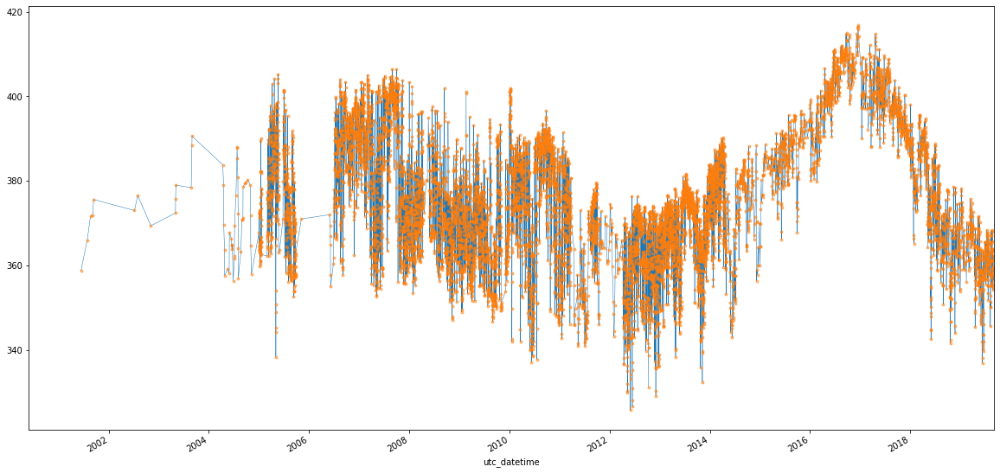

In [429]:
riverdf.smooth_interval.plot(linewidth=0.5, figsize=(20, 10))
riverdf.smooth_interval.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10))

In [430]:
riverdf.reset_index(inplace=True)

In [431]:
# Keeping data from 2016 onward where there is very little noise decreases accuracy because it makes the time windows
# too short - this is an example of over fitting and thus its best to increase time range
# Keeping data from 2010 onward
print(riverdf.index[riverdf['date'] == '2010-01-01'].to_list()[0])
print(riverdf.shape)
riverdf = riverdf.loc[4380:]
riverdf.shape

4380
(11639, 9)


(7259, 9)

In [432]:
# Checking last day of May 31st 2019
print(riverdf.index[riverdf['date'] == '2019-05-31'].to_list())

[11444, 11445, 11446]


In [433]:
# creating df for prophet

cols = ['utc_datetime','smooth_interval']
rdf = riverdf.loc[:11444,cols]

valdf = riverdf.loc[11444:,cols]
valdf.drop(columns=['smooth_interval'], axis=1, inplace=True)
valdf.rename(columns = {'utc_datetime':'ds'}, inplace=True)

rdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)

rdf = rdf.reset_index()
rdf.drop(['index'], axis=1, inplace=True)

rdf

,ds,y
0,2010-01-01 07:35:00,394.6
1,2010-01-02 02:41:00,393.0
2,2010-01-02 09:15:00,383.0
3,2010-01-02 15:13:00,381.8
4,2010-01-02 21:51:00,382.2
...,...,...
7060,2019-05-29 22:39:00,359.0
7061,2019-05-30 04:36:00,358.6
7062,2019-05-30 10:41:00,357.0
7063,2019-05-30 16:40:00,358.2


In [434]:
m = Prophet(weekly_seasonality=True, daily_seasonality=True)
m.add_seasonality(name='monthly', period=30.5, fourier_order=3)
m.add_seasonality(name='quarterly', period=120, fourier_order=3)
m.add_seasonality(name='halfyearly', period=180, fourier_order=5)
m.add_seasonality(name='3monthly', period=90, fourier_order=5)

m.fit(rdf)

future = m.make_future_dataframe(periods=1)
future = future.iloc[:-1]
future = pd.concat([future,valdf])

m_forecast = m.predict(future)

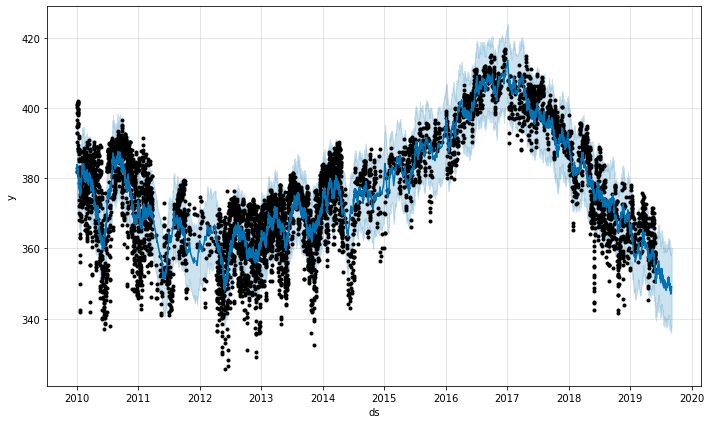

In [435]:
fig1 = m.plot(m_forecast)

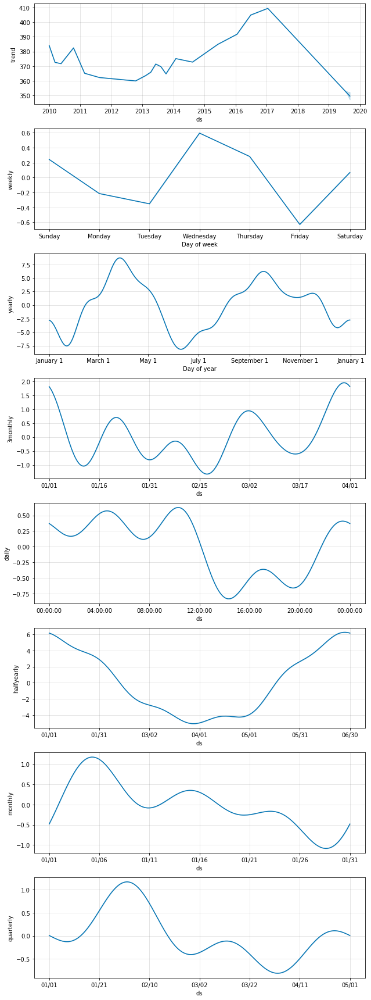

In [436]:
fig2 = m.plot_components(m_forecast)

In [437]:
testdf = riverdf.loc[11444:,['utc_datetime','smooth_interval']]
testdf.reset_index(inplace=True)

l = len(valdf['ds'])

traindf = m_forecast.iloc[(-1*l):]
traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
traindf.reset_index(inplace=True)

validate_model(testdf, traindf)

Mean Absolute Error =  9.307837588220039
Std Dev of MAE =  4.625292111362737
Mean Uncertainty in predictions  21.064715424054295
Std Dev of Uncertainty in predictions  0.7772926577971933
Percent Accuracy of predictions  100.0


0

For Riverside, additional seasonalities in the scale of half yearly and 3 monthly time periods prove to be the most informative. Weekly and Daily seasonalities are being retained to add a source of mild noise to the predictions.

In [351]:
changepoint_prior_scale_list=[0.05, 0.1, 0.25, 0.5]

for i in changepoint_prior_scale_list:
    print('changepoint prior scale', i)
    m = Prophet(changepoint_prior_scale=i, daily_seasonality=True, weekly_seasonality=True)
    m.add_seasonality(name='halfyearly', period=180, fourier_order=5)
    m.add_seasonality(name='3monthly', period=90, fourier_order=5)
    m.fit(rdf)
    future = m.make_future_dataframe(periods=1)
    future = future.iloc[:-1]
    future = pd.concat([future,valdf])
    m_forecast = m.predict(future)
    l = len(valdf['ds'])
    
    traindf = m_forecast.iloc[(-1*l):]
    traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
    traindf.reset_index(inplace=True)
    
    validate_model(testdf, traindf)

changepoint prior scale 0.05
Mean Absolute Error =  9.286208594978586
Std Dev of MAE =  4.578370115082232
Mean Uncertainty in predictions  21.12982095022327
Std Dev of Uncertainty in predictions  0.7507074551662286
Percent Accuracy of predictions  100.0
changepoint prior scale 0.1
Mean Absolute Error =  9.567961472691906
Std Dev of MAE =  4.6093914915162575
Mean Uncertainty in predictions  21.29474131619715
Std Dev of Uncertainty in predictions  0.8310877223496267
Percent Accuracy of predictions  100.0
changepoint prior scale 0.25
Mean Absolute Error =  9.691186172513733
Std Dev of MAE =  4.596228285573729
Mean Uncertainty in predictions  21.497666794295696
Std Dev of Uncertainty in predictions  1.1867152211934542
Percent Accuracy of predictions  100.0
changepoint prior scale 0.5
Mean Absolute Error =  9.750416801292857
Std Dev of MAE =  4.591868156171608
Mean Uncertainty in predictions  21.371399149637114
Std Dev of Uncertainty in predictions  1.1529711753289749
Percent Accuracy of pr

Best to stick to 0.05 as usual

In [438]:
cols = ['utc_datetime','smooth_interval']
rdf = riverdf.loc[:,cols]
rdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)
rdf = rdf.reset_index()
rdf.drop(['index'], axis=1, inplace=True)
rdf

,ds,y
0,2010-01-01 07:35:00,394.6
1,2010-01-02 02:41:00,393.0
2,2010-01-02 09:15:00,383.0
3,2010-01-02 15:13:00,381.8
4,2010-01-02 21:51:00,382.2
...,...,...
7254,2019-08-30 19:08:00,359.4
7255,2019-08-31 12:45:00,360.0
7256,2019-09-01 18:47:00,361.8
7257,2019-09-03 12:12:00,362.2


In [439]:
# Creating the Prophet object with the optimal flex parameter
m_river_production = Prophet(changepoint_prior_scale=0.05, daily_seasonality=True, weekly_seasonality=True)

# Adding the optimal seasonality parameter
m_river_production.add_seasonality(name='halfyearly', period=180, fourier_order=5)
m_river_production.add_seasonality(name='3monthly', period=90, fourier_order=5)

# Fitting all available data
m_river_production.fit(rdf)

# Creating a df for plotting purposes
future = m_river_production.make_future_dataframe(periods=1)
riverdf_forecast = m_river_production.predict(future)

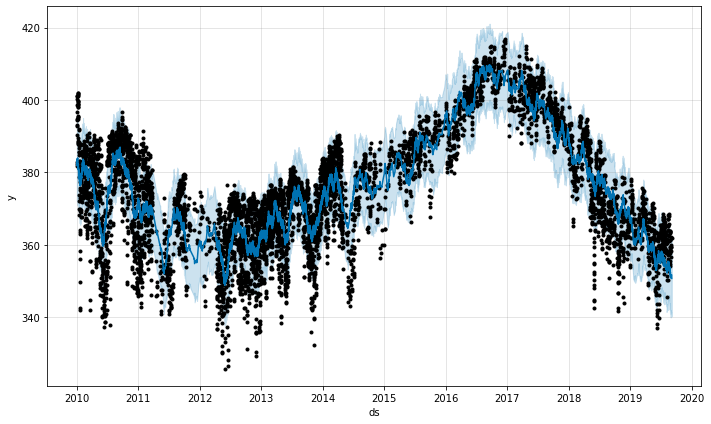

In [440]:
# Plotting the model
fig1 = m_river_production.plot(riverdf_forecast)

In [441]:
# Saving the production model
with open('m_river_production_model.pckl', 'wb') as fout:
    pickle.dump(m_river_production, fout)

End of Riverside Analysis

## Grand

In [442]:
granddf = maindf.loc[maindf['geyser'] == 'Grand']
granddf.shape

(19970, 7)

301.0     2
303.0     2
304.0     1
305.0     3
306.0     2
         ..
647.0    16
648.0    20
649.0    23
650.0     9
651.0    19
Name: t_nxt_eruption, Length: 350, dtype: int64


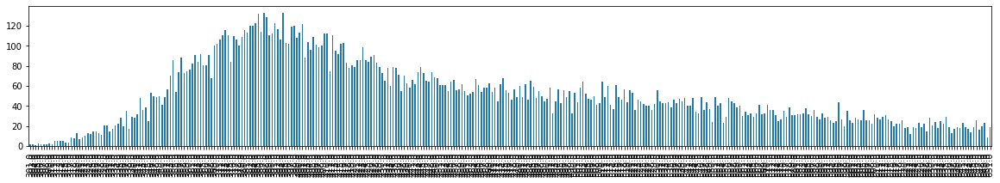

In [443]:
print(granddf['t_nxt_eruption'].value_counts().sort_index().iloc[10:360])
granddf['t_nxt_eruption'].value_counts().sort_index().iloc[10:360].plot.bar(figsize=(20,3))

In [444]:
print(granddf.shape)
granddf = granddf.loc[(granddf['t_nxt_eruption'] >= 297.0) & (granddf['t_nxt_eruption'] <= 648.0)]
print(granddf.shape)

(19970, 7)
(17788, 7)


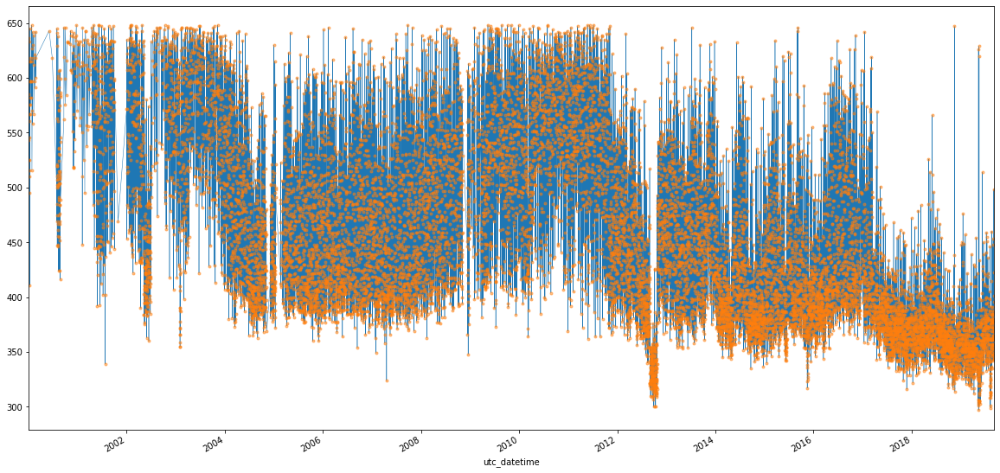

In [445]:
granddf.t_nxt_eruption.plot(linewidth=0.5, figsize=(20, 10))
granddf.t_nxt_eruption.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10))

Data collection for Grand seems extremely noisy and thus it makes sense to use a longer rolling window of 10 events

In [446]:
granddf['smooth_interval'] = granddf.t_nxt_eruption.rolling(10).mean()

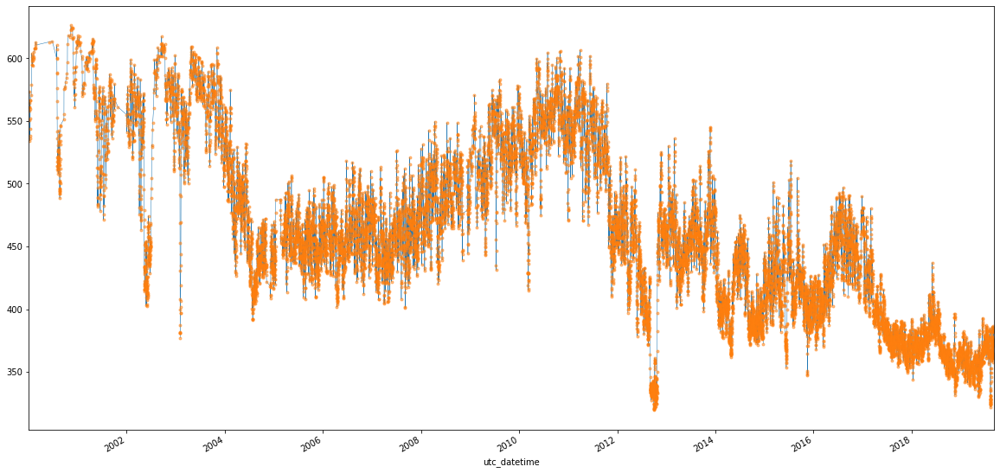

In [447]:
granddf.smooth_interval.plot(linewidth=0.5, figsize=(20, 10))
granddf.smooth_interval.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10))

In [448]:
granddf.reset_index(inplace=True)

In [449]:
# Keeping data from 2013 onward to retain the more uniform trend results in a consistent downward trend thereby
# leading to a high error as it fails to capture the recent data points
# Extending data to mid of 2003 also results in a much improved MAE and high accuracy but with still a high MAE value 
# Keeping data from 2010 reduces MAE marginally, while decreasing accuracy marginally
# Overall - makes sense to retain data from 2010 onward and tune seasonality
print(granddf.index[granddf['date'] == '2010-01-01'].to_list()[0])
print(granddf.shape)
granddf = granddf.loc[7195:]
granddf.shape

7195
(17788, 9)


(10593, 9)

In [450]:
# Checking last day of May 31st 2019
print(granddf.index[granddf['date'] == '2019-05-31'].to_list())

[17460, 17461, 17462]


In [451]:
# creating df for prophet

cols = ['utc_datetime','smooth_interval']
gdf = granddf.loc[:17460,cols]

valdf = granddf.loc[17460:,cols]
valdf.drop(columns=['smooth_interval'], axis=1, inplace=True)
valdf.rename(columns = {'utc_datetime':'ds'}, inplace=True)
print(valdf.head())

gdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)

gdf = gdf.reset_index()
gdf.drop(['index'], axis=1, inplace=True)

gdf

                       ds
17460 2019-05-31 16:12:09
17461 2019-05-31 22:18:07
17462 2019-06-01 04:18:00
17463 2019-06-01 10:18:00
17464 2019-06-01 16:13:45


,ds,y
0,2010-01-01 10:21:00,571.2
1,2010-01-01 20:45:00,564.5
2,2010-01-02 06:01:00,545.5
3,2010-01-03 02:26:00,542.1
4,2010-01-04 01:01:00,538.2
...,...,...
10261,2019-05-30 04:13:28,354.3
10262,2019-05-30 10:13:00,357.3
10263,2019-05-30 16:27:59,357.6
10264,2019-05-30 22:14:00,357.7


In [452]:
m = Prophet(weekly_seasonality=True, daily_seasonality=True)
m.add_seasonality(name='monthly', period=30.5, fourier_order=3)
m.add_seasonality(name='quarterly', period=120, fourier_order=5)
m.add_seasonality(name='halfyearly', period=180, fourier_order=5)
m.add_seasonality(name='2yearly', period=730, fourier_order=10)

m.fit(gdf)

future = m.make_future_dataframe(periods=1)
future = future.iloc[:-1]
future = pd.concat([future,valdf])

m_forecast = m.predict(future)

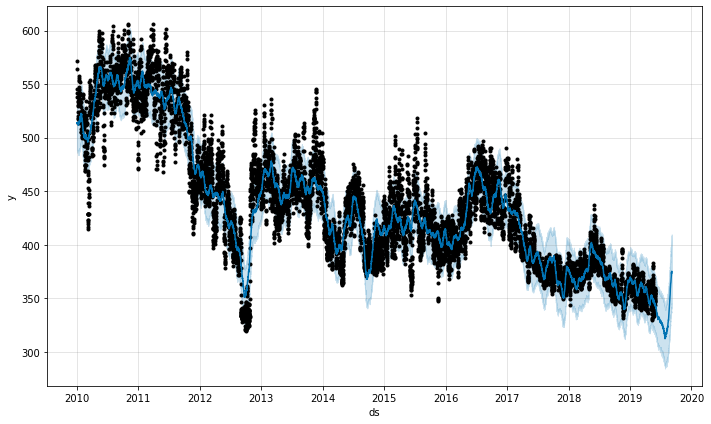

In [453]:
fig1 = m.plot(m_forecast)

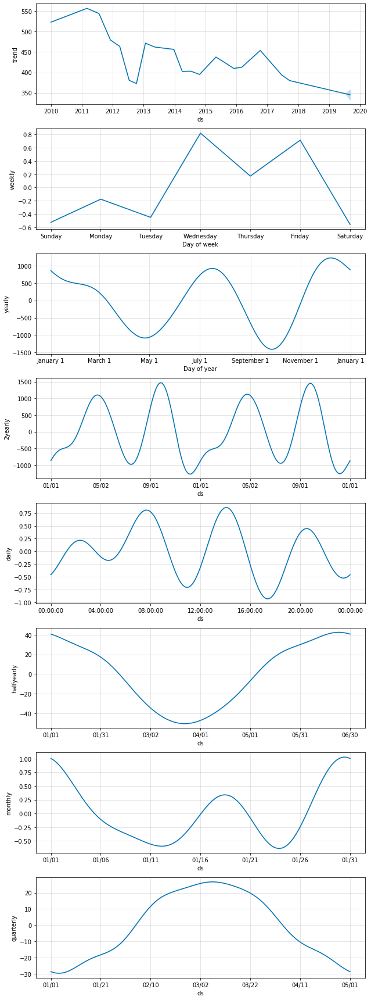

In [454]:
fig2 = m.plot_components(m_forecast)

The useful seasonalities with signal are quarterly, halfyearly, yearly and 2 yearly. Daily weekly monthly are uninformative.

In [455]:
testdf = granddf.loc[17460:,['utc_datetime','smooth_interval']]
testdf.reset_index(inplace=True)

l = len(valdf['ds'])

traindf = m_forecast.iloc[(-1*l):]
traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
traindf.reset_index(inplace=True)

validate_model(testdf, traindf)

Mean Absolute Error =  35.238316138222814
Std Dev of MAE =  17.66143490228105
Mean Uncertainty in predictions  56.04784247372509
Std Dev of Uncertainty in predictions  3.8148914459393035
Percent Accuracy of predictions  86.28048780487805


0

In [422]:
changepoint_prior_scale_list=[0.05, 0.1, 0.5, 1.0, 2.0]

for i in changepoint_prior_scale_list:
    print('changepoint prior scale', i)
    m = Prophet(changepoint_prior_scale=i, daily_seasonality=False, weekly_seasonality=False)
    m.add_seasonality(name='quarterly', period=120, fourier_order=5)
    m.add_seasonality(name='halfyearly', period=180, fourier_order=5)
    m.add_seasonality(name='2yearly', period=730, fourier_order=10)
    m.fit(gdf)
    future = m.make_future_dataframe(periods=1)
    future = future.iloc[:-1]
    future = pd.concat([future,valdf])
    m_forecast = m.predict(future)
    l = len(valdf['ds'])
    
    traindf = m_forecast.iloc[(-1*l):]
    traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
    traindf.reset_index(inplace=True)
    
    validate_model(testdf, traindf)

changepoint prior scale 0.05
Mean Absolute Error =  33.11047274475826
Std Dev of MAE =  17.494796582714336
Mean Uncertainty in predictions  56.11497468006296
Std Dev of Uncertainty in predictions  3.441786920023004
Percent Accuracy of predictions  90.85365853658537
changepoint prior scale 0.1
Mean Absolute Error =  32.59367747321227
Std Dev of MAE =  17.707543887593964
Mean Uncertainty in predictions  57.50734607357177
Std Dev of Uncertainty in predictions  6.246402508356418
Percent Accuracy of predictions  92.07317073170732
changepoint prior scale 0.5
Mean Absolute Error =  22.875680423239316
Std Dev of MAE =  9.877722278865797
Mean Uncertainty in predictions  58.90427867200665
Std Dev of Uncertainty in predictions  7.914580637745132
Percent Accuracy of predictions  100.0
changepoint prior scale 1.0
Mean Absolute Error =  20.089763905542384
Std Dev of MAE =  10.507069330245768
Mean Uncertainty in predictions  58.98759835823014
Std Dev of Uncertainty in predictions  7.852074223659792
P

The optimal changepoint prior scale value seems to be 1 with a low MAE, high accuracy and reasonable std deviation values

In [459]:
cols = ['utc_datetime','smooth_interval']
gdf = granddf.loc[:,cols]
gdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)
gdf = gdf.reset_index()
gdf.drop(['index'], axis=1, inplace=True)
gdf

,ds,y
0,2010-01-01 10:21:00,571.2
1,2010-01-01 20:45:00,564.5
2,2010-01-02 06:01:00,545.5
3,2010-01-03 02:26:00,542.1
4,2010-01-04 01:01:00,538.2
...,...,...
10588,2019-09-04 18:35:30,383.7
10589,2019-09-05 01:37:48,383.0
10590,2019-09-05 07:46:00,385.6
10591,2019-09-05 14:21:16,381.9


In [460]:
# Creating the Prophet object with the optimal flex parameter
m_grand_production = Prophet(changepoint_prior_scale=1.0, daily_seasonality=False, weekly_seasonality=False)

# Adding the optimal seasonality parameter
m_grand_production.add_seasonality(name='quarterly', period=120, fourier_order=5)
m_grand_production.add_seasonality(name='halfyearly', period=180, fourier_order=5)
m_grand_production.add_seasonality(name='2yearly', period=730, fourier_order=10)

# Fitting all available data
m_grand_production.fit(gdf)

# Creating a df for plotting purposes
future = m_grand_production.make_future_dataframe(periods=1)
granddf_forecast = m_grand_production.predict(future)

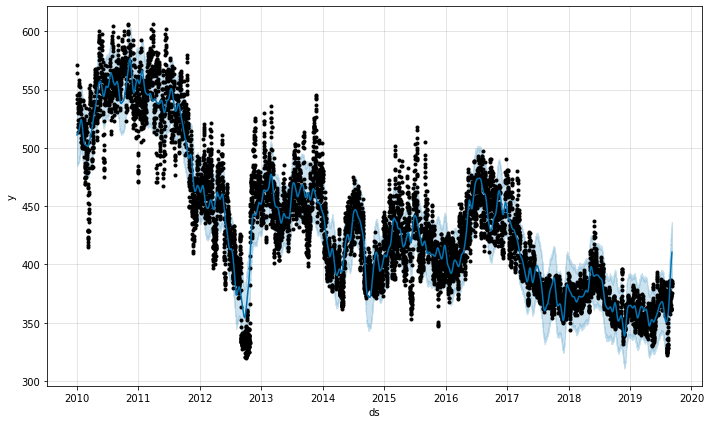

In [461]:
# Plotting the model
fig1 = m_grand_production.plot(granddf_forecast)

In [462]:
# Saving the production model
with open('m_grand_production_model.pckl', 'wb') as fout:
    pickle.dump(m_grand_production, fout)

End of Grand Analysis

## Castle

In [499]:
castledf = maindf.loc[maindf['geyser'] == 'Castle']
castledf.shape

(12770, 7)

705.0    23
706.0     6
707.0     3
708.0     5
709.0     2
         ..
930.0     8
931.0     7
932.0     6
933.0     9
934.0     7
Name: t_nxt_eruption, Length: 230, dtype: int64


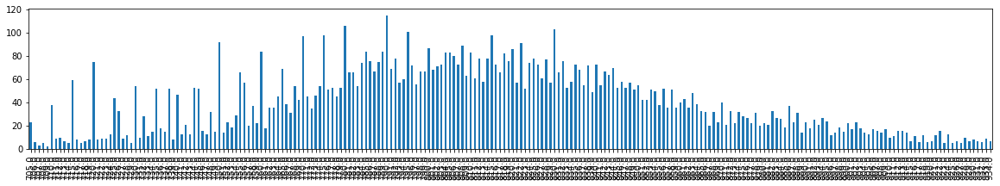

In [500]:
print(castledf['t_nxt_eruption'].value_counts().sort_index().iloc[580:810])
castledf['t_nxt_eruption'].value_counts().sort_index().iloc[580:810].plot.bar(figsize=(20,3))

In [501]:
print(castledf.shape)
castledf = castledf.loc[(castledf['t_nxt_eruption'] >= 705.0) & (castledf['t_nxt_eruption'] <= 934.0)]
print(castledf.shape)

(12770, 7)
(9287, 7)


In [502]:
cdf = castledf['2010':]

Text(0.5, 1.0, 'Interval Lengths plotted over Time')

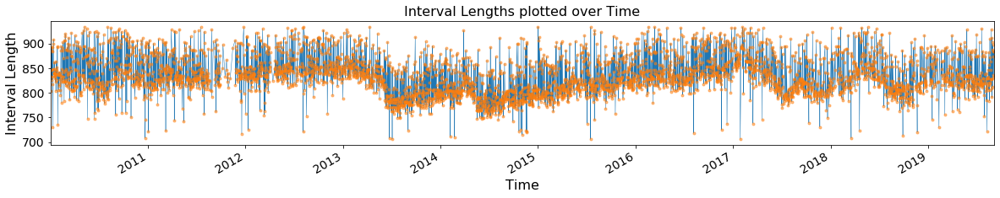

In [503]:
cdf.t_nxt_eruption.plot(linewidth=0.5, figsize=(20, 3))
ax = cdf.t_nxt_eruption.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 3), fontsize=14)
ax.set_xlabel("Time", fontsize=16)
ax.set_ylabel("Interval Length", fontsize=16)
ax.set_title("Interval Lengths plotted over Time", fontsize=16)

In [504]:
castledf['smooth_interval'] = castledf.t_nxt_eruption.rolling(5).mean()

In [505]:
cdf = castledf['2010':]

Text(0.5, 1.0, 'Smoothed Interval Lengths plotted over Time')

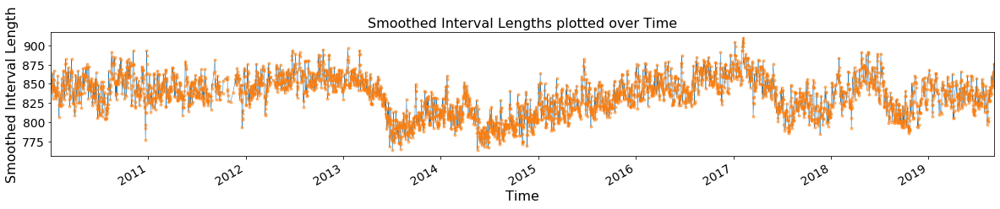

In [506]:
cdf.smooth_interval.plot(linewidth=0.5, figsize=(20, 3))
ax = cdf.smooth_interval.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 3), fontsize=14)
ax.set_xlabel("Time", fontsize=16)
ax.set_ylabel("Smoothed Interval Length", fontsize=16)
ax.set_title("Smoothed Interval Lengths plotted over Time", fontsize=16)

Text(0.5, 1.0, 'Smoothed Interval Lengths plotted over Time')

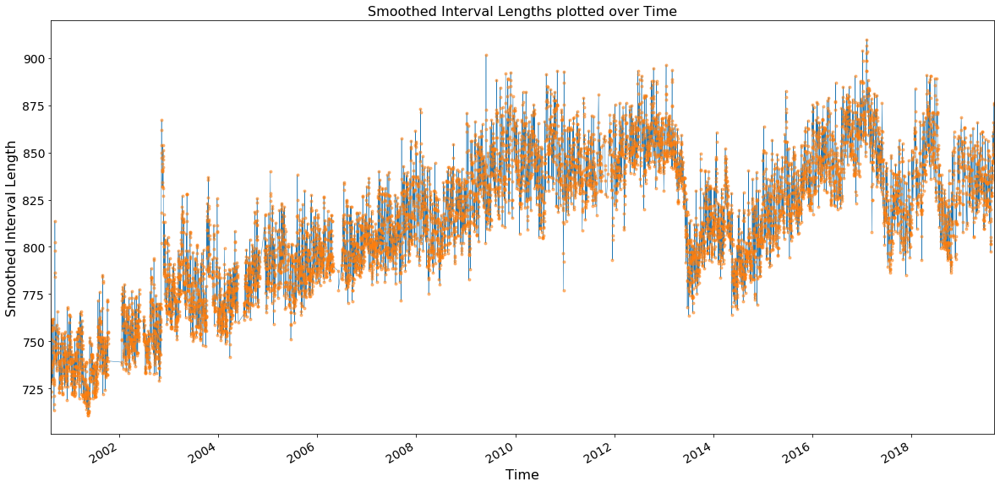

In [507]:
castledf.smooth_interval.plot(linewidth=0.5, figsize=(20, 10))
ax = castledf.smooth_interval.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10), fontsize=14)
ax.set_xlabel("Time", fontsize=16)
ax.set_ylabel("Smoothed Interval Length", fontsize=16)
ax.set_title("Smoothed Interval Lengths plotted over Time", fontsize=16)

In [508]:
castledf.reset_index(inplace=True)

In [510]:
# Keeping data from 2008
print(castledf.index[castledf['date'] == '2008-01-01'].to_list()[0])
print(castledf.shape)
castledf = castledf.loc[3672:]
castledf.shape

3672
(9287, 9)


(5615, 9)

In [511]:
# Checking last day of May 31st 2019
castledf.reset_index(inplace = True)
print(castledf.index[castledf['date'] == '2019-05-31'].to_list())

[5479, 5480]


In [512]:
# creating df for prophet

cols = ['utc_datetime','smooth_interval']
cdf = castledf.loc[:5479,cols]

valdf = castledf.loc[5479:,cols]
valdf.drop(columns=['smooth_interval'], axis=1, inplace=True)
valdf.rename(columns = {'utc_datetime':'ds'}, inplace=True)
print(valdf.head())

cdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)

cdf = cdf.reset_index()
cdf.drop(['index'], axis=1, inplace=True)

cdf.tail()

                      ds
5479 2019-05-31 06:29:00
5480 2019-06-01 00:12:00
5481 2019-06-01 14:57:00
5482 2019-06-02 08:56:00
5483 2019-06-02 23:34:00


,ds,y
5475,2019-05-28 23:15:00,852.4
5476,2019-05-29 13:06:00,831.6
5477,2019-05-30 02:50:00,832.0
5478,2019-05-30 16:45:00,829.6
5479,2019-05-31 06:29:00,825.8


In [517]:
m = Prophet(weekly_seasonality=True, daily_seasonality=True)
m.add_seasonality(name='monthly', period=30.5, fourier_order=3)
m.add_seasonality(name='quarterly', period=120, fourier_order=3)
m.add_seasonality(name='halfyearly', period=180, fourier_order=5)
m.add_seasonality(name='2yearly', period=730, fourier_order=10)
m.add_seasonality(name='5yearly', period=1825, fourier_order=10)

m.fit(cdf)

future = m.make_future_dataframe(periods=1)
future = future.iloc[:-1]
future = pd.concat([future,valdf])

m_forecast = m.predict(future)

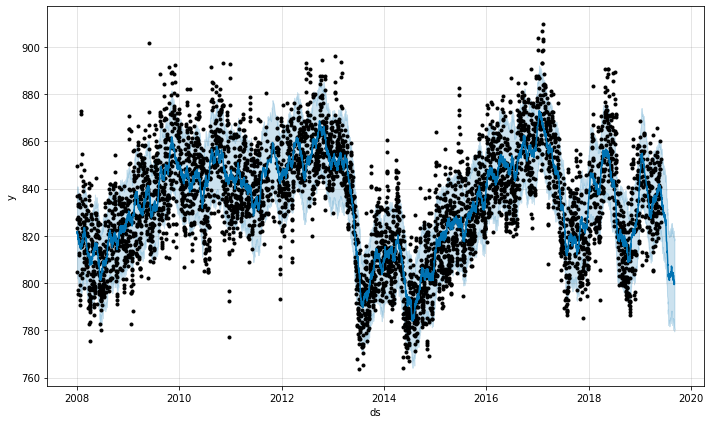

In [514]:
fig1 = m.plot(m_forecast)

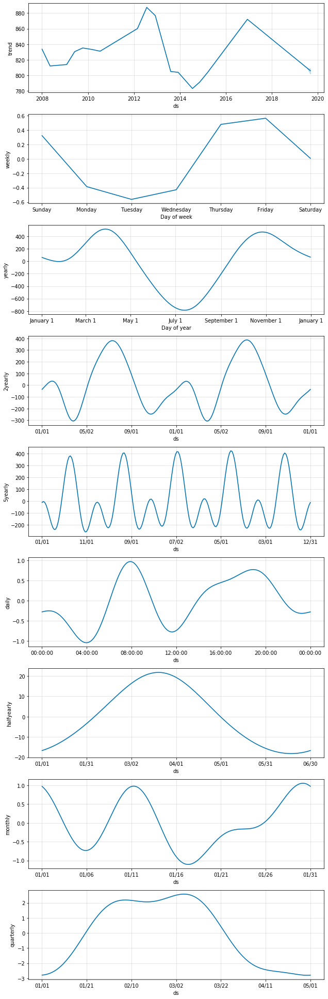

In [515]:
fig2 = m.plot_components(m_forecast)

In [516]:
testdf = castledf.loc[5479:,['utc_datetime','smooth_interval']]
testdf.reset_index(inplace=True)

l = len(valdf['ds'])

traindf = m_forecast.iloc[(-1*l):]
traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
traindf.reset_index(inplace=True)

validate_model(testdf, traindf)

Mean Absolute Error =  21.515594595743764
Std Dev of MAE =  17.841521210956063
Mean Uncertainty in predictions  37.69822361728698
Std Dev of Uncertainty in predictions  1.1028177511923551
Percent Accuracy of predictions  80.88235294117648


0

Most informative seasonalities are halfyearly, yearly, 2yearly, 5yearly. Daily, weekly, monthly & quarterly seasonalities aren't informative

In [521]:
changepoint_prior_scale_list=[0.05, 0.1, 0.5, 1.0, 2.0]

for i in changepoint_prior_scale_list:
    print('changepoint prior scale', i)
    m = Prophet(changepoint_prior_scale=i, daily_seasonality=False, weekly_seasonality=False)
    m.add_seasonality(name='halfyearly', period=180, fourier_order=5)
    m.add_seasonality(name='2yearly', period=730, fourier_order=10)
    m.add_seasonality(name='5yearly', period=1825, fourier_order=10)

    m.fit(cdf)
    future = m.make_future_dataframe(periods=1)
    future = future.iloc[:-1]
    future = pd.concat([future,valdf])
    m_forecast = m.predict(future)
    l = len(valdf['ds'])
    
    traindf = m_forecast.iloc[(-1*l):]
    traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
    traindf.reset_index(inplace=True)
    
    validate_model(testdf, traindf)

changepoint prior scale 0.05
Mean Absolute Error =  20.904353329699855
Std Dev of MAE =  17.54584899560277
Mean Uncertainty in predictions  37.58228169861758
Std Dev of Uncertainty in predictions  1.1982947870896095
Percent Accuracy of predictions  80.88235294117648
changepoint prior scale 0.1
Mean Absolute Error =  20.14385299517888
Std Dev of MAE =  16.586525866331872
Mean Uncertainty in predictions  37.42184443625227
Std Dev of Uncertainty in predictions  1.2391129972709831
Percent Accuracy of predictions  84.55882352941177
changepoint prior scale 0.5
Mean Absolute Error =  15.400025683629234
Std Dev of MAE =  12.247886742984065
Mean Uncertainty in predictions  37.82717160907315
Std Dev of Uncertainty in predictions  1.80664305136903
Percent Accuracy of predictions  94.85294117647058
changepoint prior scale 1.0
Mean Absolute Error =  13.090946351085995
Std Dev of MAE =  10.479357113076302
Mean Uncertainty in predictions  38.5161098337549
Std Dev of Uncertainty in predictions  2.5679

The best value for changepoint prior seems to be 0.5, with low MAE and reasonable std devs.

In [522]:
cols = ['utc_datetime','smooth_interval']
cdf = castledf.loc[:,cols]
cdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)
cdf = cdf.reset_index()
cdf.drop(['index'], axis=1, inplace=True)
cdf

,ds,y
0,2008-01-01 18:02:00,849.4
1,2008-01-02 08:08:00,837.0
2,2008-01-02 21:27:00,827.0
3,2008-01-03 10:53:00,823.4
4,2008-01-03 23:54:00,804.8
...,...,...
5610,2019-09-01 20:21:00,852.6
5611,2019-09-02 15:14:00,863.6
5612,2019-09-03 10:49:00,876.0
5613,2019-09-04 07:46:00,875.2


In [523]:
# Creating the Prophet object with the optimal flex parameter
m_castle_production = Prophet(changepoint_prior_scale=0.5, daily_seasonality=False, weekly_seasonality=False)

# Adding the optimal seasonality parameter
m_castle_production.add_seasonality(name='halfyearly', period=180, fourier_order=5)
m_castle_production.add_seasonality(name='2yearly', period=730, fourier_order=10)
m_castle_production.add_seasonality(name='5yearly', period=1825, fourier_order=10)

# Fitting all available data
m_castle_production.fit(cdf)

# Creating a df for plotting purposes
future = m_castle_production.make_future_dataframe(periods=1)
castledf_forecast = m_castle_production.predict(future)

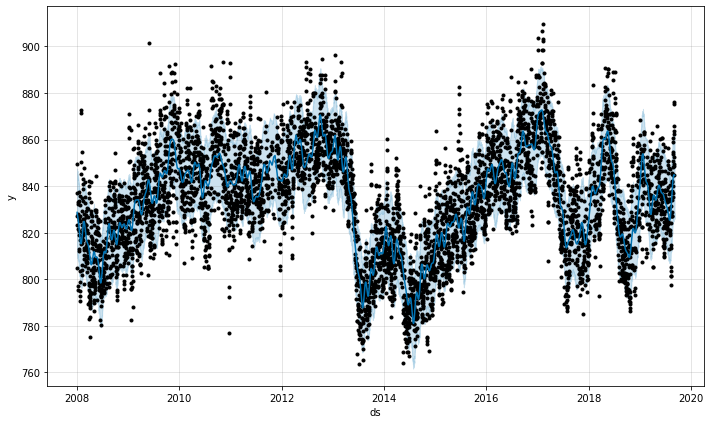

In [525]:
# Plotting the model
fig1 = m_castle_production.plot(castledf_forecast)

In [526]:
# Saving the production model
with open('m_castle_production_model.pckl', 'wb') as fout:
    pickle.dump(m_castle_production, fout)

End of Castle Analysis

## Great Fountain

In [527]:
greatdf = maindf.loc[maindf['geyser'] == 'Great Fountain']
greatdf.shape

(11514, 7)

512.0    5
513.0    2
514.0    1
515.0    1
516.0    5
        ..
908.0    5
909.0    6
910.0    9
911.0    1
912.0    6
Name: t_nxt_eruption, Length: 400, dtype: int64


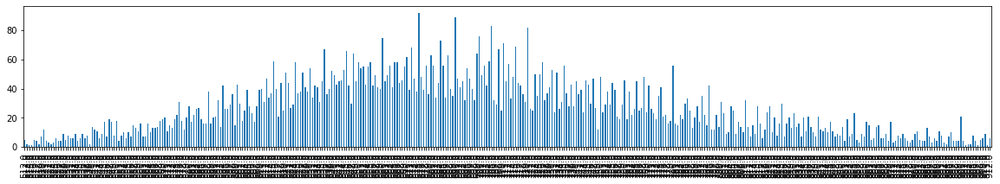

In [529]:
print(greatdf['t_nxt_eruption'].value_counts().sort_index().iloc[70:470])
greatdf['t_nxt_eruption'].value_counts().sort_index().iloc[70:470].plot.bar(figsize=(20,3))

In [530]:
print(greatdf.shape)
greatdf = greatdf.loc[(greatdf['t_nxt_eruption'] >= 517.0) & (greatdf['t_nxt_eruption'] <= 931.0)]
print(greatdf.shape)

(11514, 7)
(10527, 7)


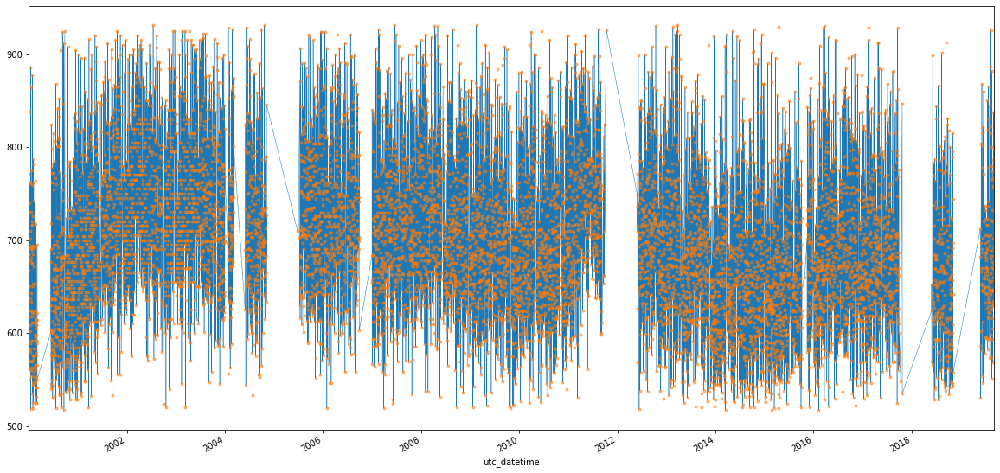

In [531]:
greatdf.t_nxt_eruption.plot(linewidth=0.5, figsize=(20, 10))
greatdf.t_nxt_eruption.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10))

Noisy data, hence averaging over 10 events

In [534]:
greatdf['smooth_interval'] = greatdf.t_nxt_eruption.rolling(10).mean()

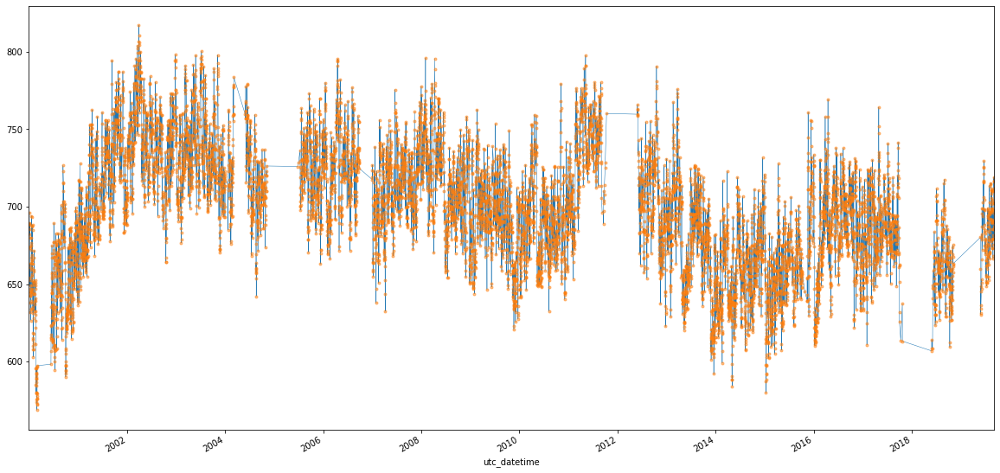

In [535]:
greatdf.smooth_interval.plot(linewidth=0.5, figsize=(20, 10))
greatdf.smooth_interval.plot(marker='.', alpha=0.5, linestyle='None', figsize=(20, 10))

In [536]:
greatdf.reset_index(inplace=True)

In [547]:
# Using everything available because of sparse data

In [537]:
# Checking last day of May 31st 2019
print(greatdf.index[greatdf['date'] == '2019-06-02'].to_list())

[10382, 10383]


In [538]:
# creating df for prophet

cols = ['utc_datetime','smooth_interval']
gfdf = greatdf.loc[:10382,cols]

valdf = greatdf.loc[10382:,cols]
valdf.drop(columns=['smooth_interval'], axis=1, inplace=True)
valdf.rename(columns = {'utc_datetime':'ds'}, inplace=True)
print(valdf.head())

gfdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)

gfdf = gfdf.reset_index()
gfdf.drop(['index'], axis=1, inplace=True)

gfdf.tail()

                       ds
10382 2019-06-02 11:15:00
10383 2019-06-03 00:39:00
10384 2019-06-04 10:29:00
10385 2019-06-04 20:10:00
10386 2019-06-05 07:01:00


,ds,y
10378,2019-05-28 00:49:00,630.4
10379,2019-05-28 12:11:00,636.1
10380,2019-05-28 23:17:00,648.6
10381,2019-05-29 10:27:00,634.4
10382,2019-06-02 11:15:00,645.1


In [539]:
m = Prophet(weekly_seasonality=True, daily_seasonality=True)
m.add_seasonality(name='monthly', period=30.5, fourier_order=3)
m.add_seasonality(name='quarterly', period=120, fourier_order=3)
m.add_seasonality(name='halfyearly', period=180, fourier_order=5)
m.add_seasonality(name='2yearly', period=730, fourier_order=10)
m.add_seasonality(name='5yearly', period=1825, fourier_order=10)

m.fit(gfdf)

future = m.make_future_dataframe(periods=1)
future = future.iloc[:-1]
future = pd.concat([future,valdf])

m_forecast = m.predict(future)

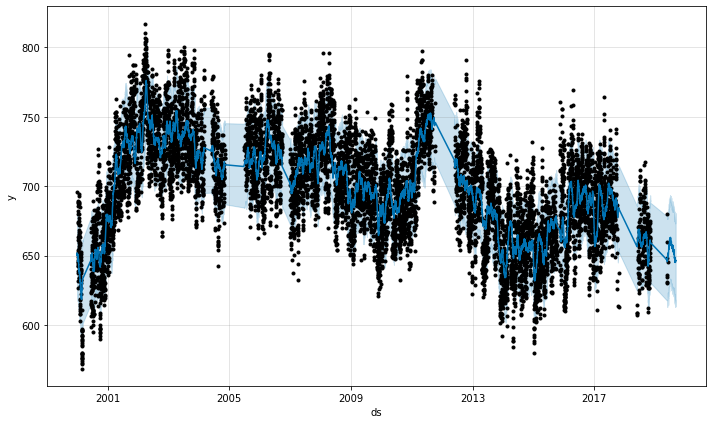

In [540]:
fig1 = m.plot(m_forecast)

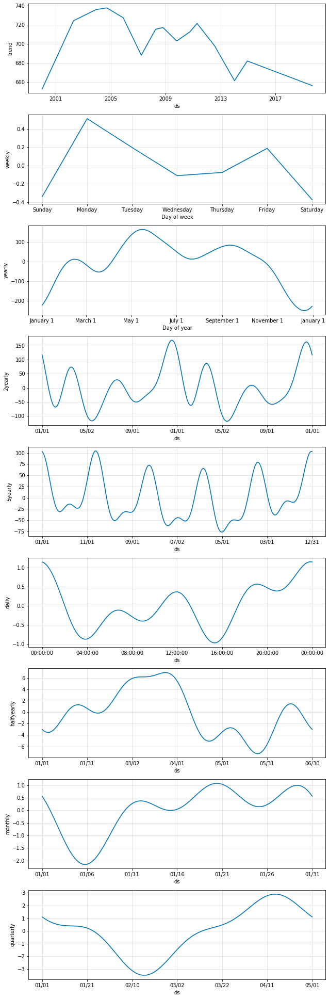

In [541]:
fig2 = m.plot_components(m_forecast)

In [542]:
testdf = greatdf.loc[10382:,['utc_datetime','smooth_interval']]
testdf.reset_index(inplace=True)

l = len(valdf['ds'])

traindf = m_forecast.iloc[(-1*l):]
traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
traindf.reset_index(inplace=True)

validate_model(testdf, traindf)

Mean Absolute Error =  32.00002250467322
Std Dev of MAE =  19.56484886033497
Mean Uncertainty in predictions  60.5912783542522
Std Dev of Uncertainty in predictions  1.64389399132838
Percent Accuracy of predictions  90.3448275862069


0

Relevant seasonalities include halfyearly, yearly, 2 yearly, 5 yearly. Daily, weekly, monthly, quarterly are irrelevant.

In [543]:
changepoint_prior_scale_list=[0.05, 0.1, 0.5, 1.0, 2.0]

for i in changepoint_prior_scale_list:
    print('changepoint prior scale', i)
    m = Prophet(changepoint_prior_scale=i, daily_seasonality=False, weekly_seasonality=False)
    m.add_seasonality(name='halfyearly', period=180, fourier_order=5)
    m.add_seasonality(name='2yearly', period=730, fourier_order=10)
    m.add_seasonality(name='5yearly', period=1825, fourier_order=10)

    m.fit(gfdf)
    future = m.make_future_dataframe(periods=1)
    future = future.iloc[:-1]
    future = pd.concat([future,valdf])
    m_forecast = m.predict(future)
    l = len(valdf['ds'])
    
    traindf = m_forecast.iloc[(-1*l):]
    traindf = traindf[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
    traindf.reset_index(inplace=True)
    
    validate_model(testdf, traindf)

changepoint prior scale 0.05
Mean Absolute Error =  32.63205215340972
Std Dev of MAE =  18.901894528744617
Mean Uncertainty in predictions  60.794575824563175
Std Dev of Uncertainty in predictions  1.8160200721763669
Percent Accuracy of predictions  89.65517241379311
changepoint prior scale 0.1
Mean Absolute Error =  32.38247074653311
Std Dev of MAE =  18.851649796459327
Mean Uncertainty in predictions  60.8215475299613
Std Dev of Uncertainty in predictions  1.8697805364782487
Percent Accuracy of predictions  91.72413793103448
changepoint prior scale 0.5
Mean Absolute Error =  33.6681942803508
Std Dev of MAE =  19.31057141970898
Mean Uncertainty in predictions  60.79414101088404
Std Dev of Uncertainty in predictions  1.5818092153225978
Percent Accuracy of predictions  88.96551724137932
changepoint prior scale 1.0
Mean Absolute Error =  35.488073554719975
Std Dev of MAE =  20.040077599303803
Mean Uncertainty in predictions  60.701876545806805
Std Dev of Uncertainty in predictions  1.751

Best value for changepoint prior = 0.1

In [544]:
cols = ['utc_datetime','smooth_interval']
gfdf = greatdf.loc[:,cols]
gfdf.rename(columns = {'utc_datetime':'ds', 'smooth_interval':'y'}, inplace=True)
gfdf = gfdf.reset_index()
gfdf.drop(['index'], axis=1, inplace=True)
gfdf

,ds,y
0,2000-01-01 12:12:00,NaN
1,2000-01-01 23:37:00,NaN
2,2000-01-02 11:18:00,NaN
3,2000-01-03 00:09:00,NaN
4,2000-01-03 11:34:00,NaN
...,...,...
10522,2019-09-02 16:12:00,716.2
10523,2019-09-03 03:27:00,716.7
10524,2019-09-04 10:36:00,710.2
10525,2019-09-04 22:07:00,711.7


In [545]:
# Creating the Prophet object with the optimal flex parameter
m_greatfountain_production = Prophet(changepoint_prior_scale=0.1, daily_seasonality=False, weekly_seasonality=False)

# Adding the optimal seasonality parameter
m_greatfountain_production.add_seasonality(name='halfyearly', period=180, fourier_order=5)
m_greatfountain_production.add_seasonality(name='2yearly', period=730, fourier_order=10)
m_greatfountain_production.add_seasonality(name='5yearly', period=1825, fourier_order=10)

# Fitting all available data
m_greatfountain_production.fit(gfdf)

# Creating a df for plotting purposes
future = m_greatfountain_production.make_future_dataframe(periods=1)
gfdf_forecast = m_greatfountain_production.predict(future)

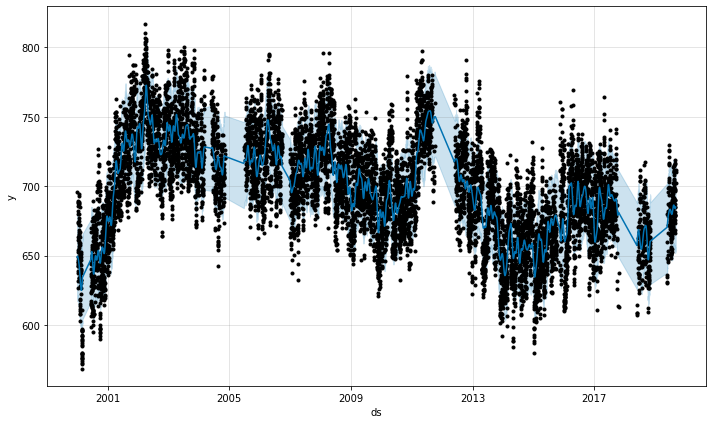

In [546]:
# Plotting the model
fig1 = m_greatfountain_production.plot(gfdf_forecast)

In [548]:
# Saving the production model
with open('m_greatfountain_production_model.pckl', 'wb') as fout:
    pickle.dump(m_greatfountain_production, fout)

End of Great Fountain Analysis

#### End of notebook.